# Project Data Science: Locatiebepaling

##### Bij de 1e en 2e dataset was ik veel modellen aan het uitproberen, bij de 3e dataset heb ik mij gefocused op het model dat volgens mij het meest geschikt was.

## 1e Dataset 

### Data Inladen & Structuur In De Data Brengen

    -Wat zijn de min en max signaalsterktes?
    -Is de Wifi naam van belang om de locatie te bepalen? Of enkel het MAC adres?
    -Hoeveel MAC adressen zijn er per locatie beschikbaar?

In [1]:
with open("./project.txt") as file1:
    data=[x for x in file1]
    
data = [x for x in data]
data = [x.replace(" ", "") for x in data]
data = [x.split("&") for x in data]

iter1 = 0
iter2 = 0
iter3 = 0

macCount = {}
minSterkte = 200
maxSterkte = 0
            
for x in data:
    iter1 += 1
    iter2 = 0
    print("\n\n")
    print(iter1)
    for y in x:
        iter2 += 1
        iter3 = 0
        if (iter2%4) == 0:
            y = y.split(",")
            y[0] = y[0].replace("WifiInfo=", "")
            for z in y:
                iter3 += 1
                print( iter3, end = " ")
                print( z[:z.index("@")], end = "  ")
                print( z[z.index("@")+1:z.index(":")], end = "  ")
                print( z[z.index(":")+2:])
                
                sterkte = int(z[z.index(":")+2:])
                if sterkte > maxSterkte:
                    maxSterkte = sterkte
                if sterkte < minSterkte:
                    minSterkte = sterkte
                    
                if z[z.index("@")+1:z.index(":")] not in macCount:
                    macCount[ z[z.index("@")+1:z.index(":")]] = 1
                else:
                    macCount[ z[z.index("@")+1:z.index(":")]] += 1                
        else:
            print(y)




1
Time=12/0306:08:41
Sender=44:6E:E5:C5:8F:4F
Location=gang@0.65625;0.04449
1 ODISEE  88-1d-fc-30-d4-40  75
2 campusroam  88-1d-fc-30-d4-43  73
3 ODISEE  88-1d-fc-30-d5-50  78
4 eduroam  88-1d-fc-30-d4-42  74
5 eduroam  88-1d-fc-30-d5-52  78
6 campusroam  88-1d-fc-30-d5-53  77
7 ODISEEGuest  88-1d-fc-30-d4-41  75
8 ODISEEGuest  88-1d-fc-30-d5-51  78
9 CiscoC5976  58-6d-8f-19-14-38  82
10 rechts  58-6d-8f-19-10-fc  51
11 ODISEE  88-1d-fc-41-dc-50  67
12 eduroam  88-1d-fc-41-dc-52  67
13 campusroam  88-1d-fc-41-dc-53  67
14 eduroam  88-1d-fc-2c-c0-02  73
15 campusroam  88-1d-fc-2c-c0-03  71
16 ODISEE  88-1d-fc-2c-c0-00  74
17 telenet-5467D  dc-53-7c-85-46-82  87
18 ODISEEGuest  88-1d-fc-41-dc-51  65
19 ODISEEGuest  88-1d-fc-2c-c0-01  73
20 CiscoC5959  58-6d-8f-19-13-f4  81
21 TELENETHOMESPOT  02-53-7c-85-46-83  86




2
Time=12/0306:08:53
Sender=44:6E:E5:C5:8F:4F
Location=gang@0.61875;0.13758
1 ODISEE  88-1d-fc-30-d4-40  74
2 campusroam  88-1d-fc-30-d4-43  74
3 ODISEE  88-1d-fc-30-d5-

### Wat Is De Minimum En Maximum Signaalsterkte? Hoe Vaak Komt Ieder Mac Adres Voor?

             Mac_Adres  Aantal
8    58-6d-8f-19-14-38     106
9    58-6d-8f-19-10-fc     105
19   58-6d-8f-19-13-f4      97
3    88-1d-fc-30-d4-42      82
0    88-1d-fc-30-d4-40      81
52   58-6d-8f-19-11-48      77
6    88-1d-fc-30-d4-41      76
17   88-1d-fc-41-dc-51      75
10   88-1d-fc-41-dc-50      75
12   88-1d-fc-41-dc-53      75
1    88-1d-fc-30-d4-43      75
11   88-1d-fc-41-dc-52      73
26   88-1d-fc-44-9c-23      58
27   88-1d-fc-44-9c-22      58
28   88-1d-fc-44-9c-20      57
29   88-1d-fc-44-9c-21      56
76   88-1d-fc-30-d4-4d      50
77   88-1d-fc-30-d4-4e      50
78   88-1d-fc-30-d4-4c      48
75   88-1d-fc-30-d4-4f      47
16   dc-53-7c-85-46-82      47
65   88-1d-fc-41-dc-5f      47
67   88-1d-fc-41-dc-5e      45
20   02-53-7c-85-46-83      44
66   88-1d-fc-41-dc-5d      43
68   88-1d-fc-41-dc-5c      43
72   88-1d-fc-44-9c-2e      35
73   88-1d-fc-44-9c-2c      34
70   88-1d-fc-44-9c-2d      33
71   88-1d-fc-44-9c-2f      31
..                 ...     ...
109  88-

[]

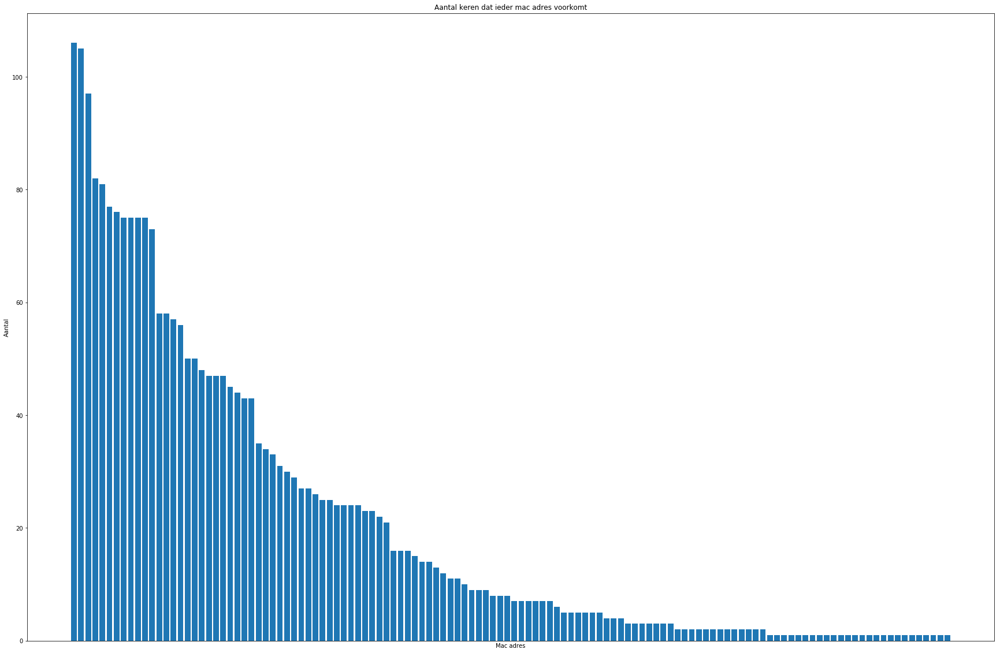

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

MacCountP = pd.DataFrame(list(macCount.items()), columns = ["Mac_Adres", "Aantal"])
SortedMacCount = MacCountP.sort_values(["Aantal"], ascending = False)
print(SortedMacCount)

plt.figure(figsize = (30,20))
plt.bar(SortedMacCount.Mac_Adres, SortedMacCount.Aantal)
#Ik haal de tekst weg van de x-as omdat het niet leesbaar is.
barChart = plt.gca()
barChart.axes.get_xaxis().set_ticks([])
plt.xlabel("Mac adres")
plt.ylabel("Aantal")
plt.title("Aantal keren dat ieder mac adres voorkomt")
plt.plot()

Omdat er 115 locaties zijn en geen enkel mac adres 115 keer voorkomt kan ik hieruit afleiden dat er geen enkel mac adres op iedere locatie voorkomt.
    
    -Hoe vaak komt een mac adres gemiddeld voor in de data?
    -Zijn de mac adressen die weinig voorkomen van belang om de locatie te bepalen?
    

In [3]:
print(SortedMacCount.mean())

Aantal    20.637097
dtype: float64


### Data In DataFrame Stoppen

    -Voor iedere locatie: datum, tijd, sender en ieder mac adres met overeenkomstige sterkte bijhouden,
    -Voor iedere locatie alle mogelijke mac adressen toevoegen,
    -Degene dat er nog niet bijzitten sterkte NaN geven.

In [4]:
import numpy as np

dataLoD = []

for x in data:
    datapunt = {}
    iter2 = 0
   
    for y in x:
        iter2 += 1
        iter3 = 0
        
        if iter2 == 1:
            datapunt["Date"] = y[5:10]
            datapunt[ y[:4] ] = y[10:]
            
        elif iter2 == 2:
            datapunt[y[:6]] = y[7:]
            
        elif iter2 == 3:
            datapunt[y[:8]] = y[y.index("=")+1:y.index("@")]
            datapunt[str(y[:8]) + "X"] = float(y[y.index("@")+1:y.index(";")])
            datapunt[str(y[:8]) + "Y"] = float(y[y.index(";")+1:])
            
        elif iter2 == 4:
            y = y.split(",")
            y[0] = y[0].replace("WifiInfo=", "")
            y[len(y)-1] = y[len(y)-1].replace("\n", "")
            for z in y:
                datapunt[ z[z.index("@")+1:z.index(":")] ] = int(z[z.index(":")+2:])                   
                
    dataLoD.append(datapunt)
     
for x in dataLoD:
    for y in macCount.keys():
        if y not in x:
            x[y] = np.NaN 
    
dataF = pd.DataFrame(dataLoD)

frontColumns = dataF[["Time", "Date", "Sender", "Location", "LocationX", "LocationY"]]
backColumns = dataF.drop(columns = ["Time", "Date", "Sender", "Location", "LocationX", "LocationY"])
dataF = pd.concat([frontColumns, backColumns], axis=1, sort=False)

dataF.head(10)



,Time,Date,Sender,Location,LocationX,LocationY,00-1d-6a-a4-ae-6a,00-1e-94-02-1e-c0,00-78-9e-69-a6-bb,00-95-69-a9-04-45,...,a2-c5-89-be-c2-b5,aa-db-03-0b-ab-39,b0-4e-26-b0-8e-8a,dc-53-7c-45-b1-3f,dc-53-7c-45-b1-40,dc-53-7c-85-46-82,de-53-3c-de-e7-c6,e0-b9-e5-e4-5e-0b,e2-b9-e5-e4-5e-0e,fa-8f-ca-57-5f-57
0,06:08:41,12/03,44:6E:E5:C5:8F:4F,gang,0.65625,0.04449,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,87.0,NaN,NaN,NaN,NaN
1,06:08:53,12/03,44:6E:E5:C5:8F:4F,gang,0.61875,0.13758,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,87.0,NaN,NaN,NaN,NaN
2,06:09:03,12/03,44:6E:E5:C5:8F:4F,gang,0.26250,0.13826,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,82.0,NaN,NaN,NaN,NaN
3,06:09:17,12/03,44:6E:E5:C5:8F:4F,gang,0.63333,0.31006,NaN,NaN,NaN,NaN,...,NaN,NaN,85.0,NaN,NaN,82.0,NaN,NaN,NaN,NaN
4,06:09:41,12/03,44:6E:E5:C5:8F:4F,gang,0.63958,0.49555,NaN,NaN,NaN,NaN,...,NaN,NaN,85.0,NaN,NaN,86.0,NaN,NaN,NaN,NaN
5,06:09:58,12/03,44:6E:E5:C5:8F:4F,gang,0.64167,0.61602,NaN,NaN,NaN,NaN,...,NaN,NaN,85.0,NaN,NaN,86.0,NaN,NaN,NaN,NaN
6,06:10:14,12/03,44:6E:E5:C5:8F:4F,gang,0.64688,0.78371,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,82.0,NaN,NaN,NaN,NaN
7,06:10:27,12/03,44:6E:E5:C5:8F:4F,gang,0.64792,0.93018,NaN,NaN,NaN,NaN,...,NaN,NaN,83.0,NaN,NaN,82.0,NaN,NaN,NaN,NaN
8,06:10:38,12/03,44:6E:E5:C5:8F:4F,gang,0.32604,0.96988,NaN,NaN,NaN,NaN,...,NaN,NaN,81.0,NaN,NaN,81.0,NaN,NaN,NaN,NaN
9,06:11:02,12/03,44:6E:E5:C5:8F:4F,docenten,0.26146,0.64545,NaN,NaN,NaN,NaN,...,NaN,NaN,85.0,NaN,NaN,81.0,NaN,NaN,NaN,NaN


### Sterktes Visueel Weergeven

    -Nu ga ik voor ieder mac adres een grafiek plotten dat de locatie in de gang weergeeft;
    -Ieder punt, dat een locatie voorstelt, krijgt een kleur naar gelang hoe sterk de signaalsterkte is. 
    -Zodat ik zie  waar de signaalsterkte voor een bepaald mac adres het sterkst is.    

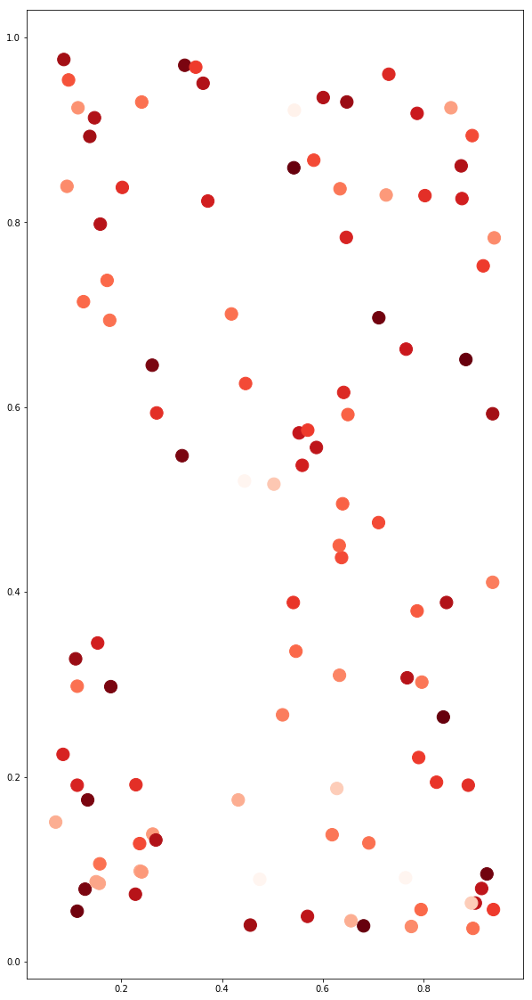

In [5]:
x = dataF[["LocationX"]]
y = dataF[["LocationY"]]
sterktes = dataF[["58-6d-8f-19-10-fc"]].values.tolist()

plt.figure(figsize=(10,20))
plt.scatter(x, y, c = sterktes, cmap = "Reds", s = 200)
plt.show()

### Omdat de vorige plot veel twijfels teweeg bracht, maak ik een tweede plot om zeker te zijn dat de coöridnaten relatief zijn per lokaal en niet absoluut over heel de gang.

    - Ik plot iedere coördinaat uit en geef het punt een kleur dat overeen komt met een bepaald lokaal.
    - Als de coördinaten absoluut zijn, zou ik alle kleuren gegroepeerd per lokaal moeten zien

{'gang': 'red', 'docenten': 'blue', 'lab4': 'navy', 'lab5': 'tomato', 'lab2': 'green', 'lab1': 'yellow', 'lab6': 'k', 'D036': 'tan', 'projectlokaal': 'gold', 'K.VanAssche': 'aqua', 'lab3': 'pink'}


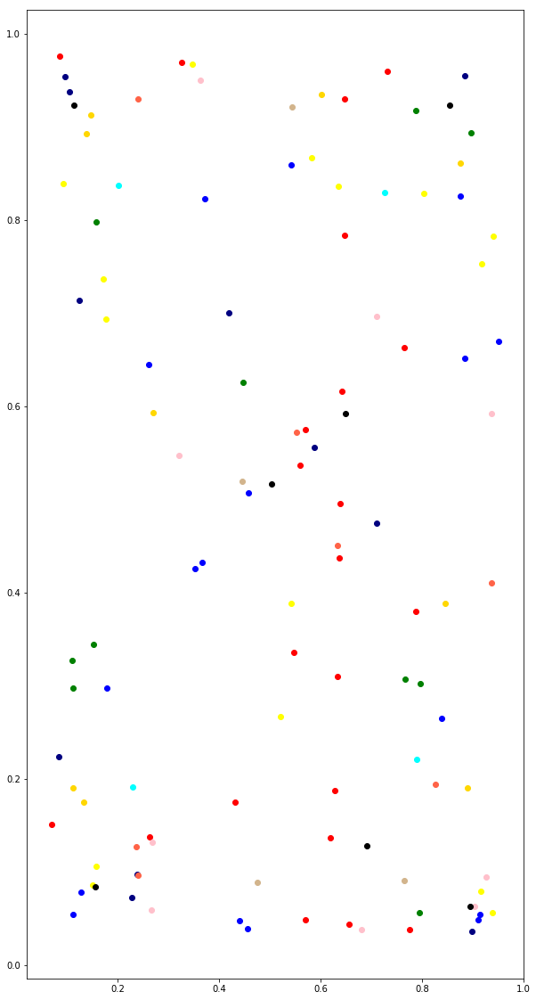

In [6]:

lokalen = dataF[["Location"]]
alleLokalen = []

for i in lokalen.values.tolist():
    if i not in alleLokalen:
        alleLokalen.append(i)

kleuren = ["red", "blue", "navy", "tomato", "green", "yellow", "k", "tan", "gold", "aqua", "pink"]

dictLokalen = {}
for lokaal, kleur in zip(alleLokalen, kleuren):
    dictLokalen[lokaal[0]] = kleur
print(dictLokalen)

plt.figure(figsize=(10,20))
for a, b, lokaal in zip(x.values,y.values,lokalen.values):
    kleur = dictLokalen.get(lokaal[0])
    plt.scatter(a,b,c=kleur)
    
plt.show()

### Nu dat ik zeker ben dat de coördinaten relatief per lokaal zijn, zoek ik naar een manier om ze absoluut te maken.

In [7]:
AbsoluutX = []
AbsoluutY = []
iter4 = 0
for x1, y1, lokaal in zip(dataF[["LocationX"]].values, dataF[["LocationY"]].values, lokalen.values):
    if lokaal == ["K.VanAssche"]:
        AbsoluutX.append(22.388 * x1[0])
        AbsoluutY.append(10.465 * y1[0])
    elif lokaal == ["lab6"]:
        AbsoluutX.append(44.776 * x1[0])
        AbsoluutY.append(((41.860 - 20.930) * y1[0]) + 20.930 )
    elif lokaal == ["lab5"]:
        AbsoluutX.append(44.776 * x1[0])
        AbsoluutY.append(((60.465 - 41.860) * y1[0]) + 41.860)
    elif lokaal == ["lab4"]:
        AbsoluutX.append(44.776 * x1[0])
        AbsoluutY.append(((79.070 - 60.465) * y1[0]) + 60.465)
    elif lokaal == ["lab1"]:
        AbsoluutX.append(((100 - 60.199) * x1[0]) + 60.199)
        AbsoluutY.append(((23.023 - 5.162) * y1[0]) + 5.162)
    elif lokaal == ["lab2"]:
        AbsoluutX.append(((100 - 60.199) * x1[0]) + 60.199)
        AbsoluutY.append(((53.488 - 34.186) * y1[0]) + 34.186)
    elif lokaal == ["lab3"]:
        AbsoluutX.append(((100 - 60.199) * x1[0]) + 60.199)
        AbsoluutY.append(((79.070 - 53.488) * y1[0]) + 53.488)
    elif lokaal == ["projectlokaal"]:
        AbsoluutX.append(((44.776 - 9.453) * x1[0]) + 9.453)
        AbsoluutY.append(((100 - 84.186) * y1[0]) + 84.186)
    elif lokaal == ["docenten"]:
        AbsoluutX.append(((100 - 60.199) * x1[0]) + 60.199)
        AbsoluutY.append(((100 - 79.070) * y1[0]) + 79.070)
    elif lokaal == ["D036"]:
        AbsoluutX.append(((44.776 - 22.388) * x1[0]) + 22.388)
        AbsoluutY.append(((20.930 - 13.372) * y1[0]) + 13.372)
    elif lokaal == ["gang"]:
        AbsoluutX.append(((60.199 - 44.776) * x1[0]) + 44.776)
        AbsoluutY.append(84.186 * y1[0])

### Absolute Coördinaten Toevoegen Aan Dataframe

In [8]:
absX = pd.DataFrame(AbsoluutX, columns=["AbsoluutX"])
absY = pd.DataFrame(AbsoluutY, columns=["AbsoluutY"])

dataF = pd.concat([frontColumns, absX, absY, backColumns], axis=1, sort=False)
dataF.head(10)

,Time,Date,Sender,Location,LocationX,LocationY,AbsoluutX,AbsoluutY,00-1d-6a-a4-ae-6a,00-1e-94-02-1e-c0,...,a2-c5-89-be-c2-b5,aa-db-03-0b-ab-39,b0-4e-26-b0-8e-8a,dc-53-7c-45-b1-3f,dc-53-7c-45-b1-40,dc-53-7c-85-46-82,de-53-3c-de-e7-c6,e0-b9-e5-e4-5e-0b,e2-b9-e5-e4-5e-0e,fa-8f-ca-57-5f-57
0,06:08:41,12/03,44:6E:E5:C5:8F:4F,gang,0.65625,0.04449,54.897344,3.745435,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,87.0,NaN,NaN,NaN,NaN
1,06:08:53,12/03,44:6E:E5:C5:8F:4F,gang,0.61875,0.13758,54.318981,11.582310,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,87.0,NaN,NaN,NaN,NaN
2,06:09:03,12/03,44:6E:E5:C5:8F:4F,gang,0.26250,0.13826,48.824538,11.639556,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,82.0,NaN,NaN,NaN,NaN
3,06:09:17,12/03,44:6E:E5:C5:8F:4F,gang,0.63333,0.31006,54.543849,26.102711,NaN,NaN,...,NaN,NaN,85.0,NaN,NaN,82.0,NaN,NaN,NaN,NaN
4,06:09:41,12/03,44:6E:E5:C5:8F:4F,gang,0.63958,0.49555,54.640242,41.718372,NaN,NaN,...,NaN,NaN,85.0,NaN,NaN,86.0,NaN,NaN,NaN,NaN
5,06:09:58,12/03,44:6E:E5:C5:8F:4F,gang,0.64167,0.61602,54.672476,51.860260,NaN,NaN,...,NaN,NaN,85.0,NaN,NaN,86.0,NaN,NaN,NaN,NaN
6,06:10:14,12/03,44:6E:E5:C5:8F:4F,gang,0.64688,0.78371,54.752830,65.977410,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,82.0,NaN,NaN,NaN,NaN
7,06:10:27,12/03,44:6E:E5:C5:8F:4F,gang,0.64792,0.93018,54.768870,78.308133,NaN,NaN,...,NaN,NaN,83.0,NaN,NaN,82.0,NaN,NaN,NaN,NaN
8,06:10:38,12/03,44:6E:E5:C5:8F:4F,gang,0.32604,0.96988,49.804515,81.650318,NaN,NaN,...,NaN,NaN,81.0,NaN,NaN,81.0,NaN,NaN,NaN,NaN
9,06:11:02,12/03,44:6E:E5:C5:8F:4F,docenten,0.26146,0.64545,70.605369,92.579268,NaN,NaN,...,NaN,NaN,85.0,NaN,NaN,81.0,NaN,NaN,NaN,NaN


## Kolommen Met Absolute Coördinaten Uitplotten Met Kleur Dat Overeenkomt Met Een Bepaald Lokaal

C:\Users\jemij\Anaconda3\lib\site-packages\matplotlib\figure.py:98: MatplotlibDeprecationWarning: 
Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  "Adding an axes using the same arguments as a previous axes "


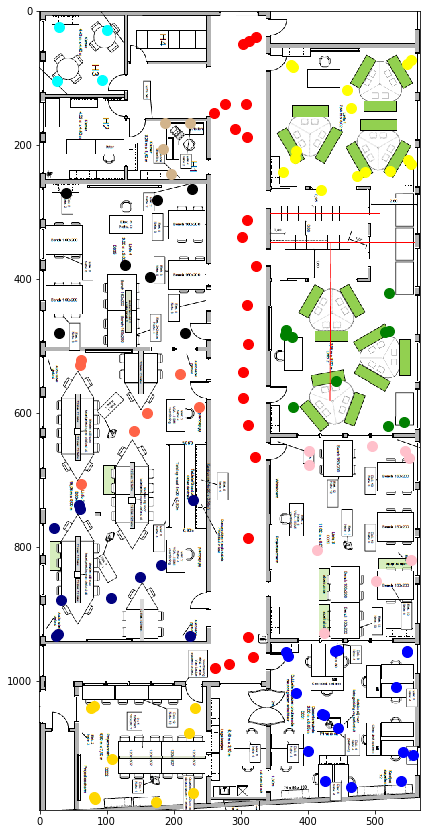

gang red 22
docenten blue 17
lab4 navy 11
lab5 tomato 7
lab2 green 10
lab1 yellow 15
lab6 k 7
D036 tan 4
projectlokaal gold 9
K.VanAssche aqua 4
lab3 pink 9


In [9]:
imgpath = "./images/ikdoeict180Rotated.png"
img = plt.imread(imgpath)

fig = plt.figure(figsize=(15,30))
ax1 = fig.add_subplot(1, 2, 1)
ax2 = fig.add_subplot(1, 2, 1)

# Coördinaten omzetten naar waarden die overeenkomen met de afbeelding van 568px * 1193px
absX[['AbsoluutX']] = absX[['AbsoluutX']].apply(lambda x: x*5.68)
absY[['AbsoluutY']] = absY[['AbsoluutY']].apply(lambda x: x*11.93)

ax1.imshow(img)
for a, b, lokaal in zip(absX.values,absY.values,lokalen.values):
    kleur = dictLokalen.get(lokaal[0])
    ax2.scatter(a,b,c=kleur, s=100)

plt.show()
    
lokaalCount = {}    
for lokaal in lokalen.values:
    if lokaal[0] not in lokaalCount:
        lokaalCount[f"{lokaal[0]}"] = 1
    else:
        lokaalCount[f"{lokaal[0]}"] += 1

for key, kleur, aantal in zip(lokaalCount.keys(), kleuren, lokaalCount.values()):
    print(key,kleur, aantal)

## Voor ieder mac adres, alle locaties uitplotten op de plattegrond, en voor iedere locatie de overeenkomsitge sterkte weergeven door een kleur.

In [10]:
imgpath = "./images/ikdoeict180Rotated.png"
img = plt.imread(imgpath)

fig = plt.figure(figsize=(40,500))
ax = []

for x in np.arange(1,125):
    ax.append(fig.add_subplot(31, 4, x))

for x in np.arange(0,124):
    ax[x].imshow(img)
    ax[x].scatter(absX,absY, c = dataF[[f"{SortedMacCount.iloc[x,0]}"]].values.tolist(), cmap = "seismic", s = 200)
    ax[x].set_title(f"{SortedMacCount.iloc[x,0]} # of locations: {SortedMacCount.iloc[x,1]} ")

plt.show()

## Modellen opstellen

### K Nearest Neighbors 

#### KNN Regressie Om De Absolute X Coördinaat Te Bepalen

C:\Users\jemij\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:66: DeprecationWarning: Class Imputer is deprecated; Imputer was deprecated in version 0.20 and will be removed in 0.22. Import impute.SimpleImputer from sklearn instead.
  warnings.warn(msg, category=DeprecationWarning)


Beste test score:  k = 2, rs = 0: 76.59607611930234%
Beste mse score:   k = 2, rs = 0: 191.34641347705283%


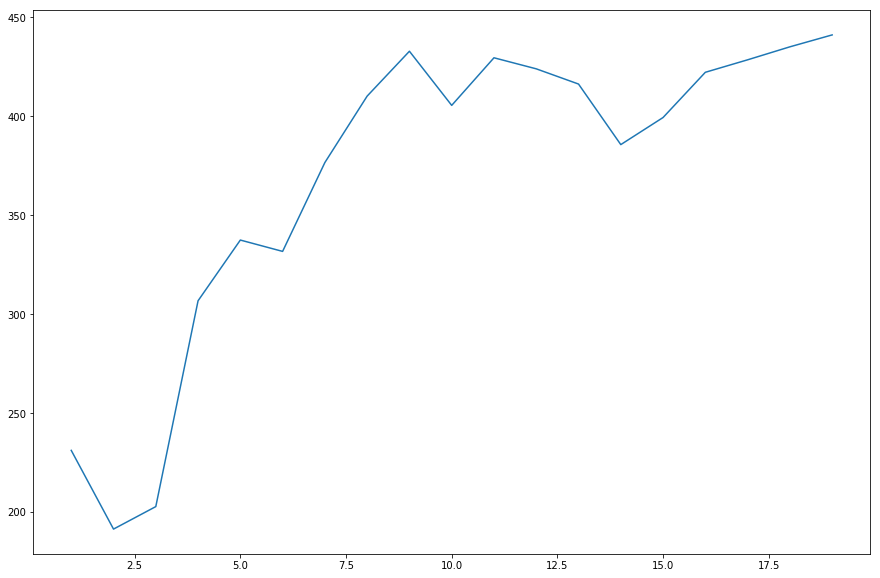

In [11]:
from sklearn import preprocessing
from sklearn import neighbors
from sklearn import model_selection
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

X = dataF.iloc[:,8:]
Y = dataF.iloc[:,6]
imp = preprocessing.Imputer(missing_values='NaN', strategy='median', axis=0, copy=True)
Ximp = imp.fit_transform(X)

mseList = []
k_waarden = np.arange(1,20)
best_value_test = [0,0,0]
best_value_mse = [20000,0,0]
for k in k_waarden:
    for rs in range(0,3):
        x_train, x_test, y_train,  y_test = train_test_split(Ximp, Y,  test_size=0.33, random_state = rs)
        
        KNNRegX = neighbors.KNeighborsRegressor(n_neighbors=k)
        KNNRegX.fit(x_train, y_train)
        y_pred = KNNRegX.predict(x_test)
        
        if rs == 0:
            mseList.append(mean_squared_error(y_test, y_pred))
        '''
        
        print(f"Training score for k = {k}, rs = {rs}: {KNNRegX.score(x_train,y_train)*100}%")
        print(f"Test score for     k = {k}, rs = {rs}: {KNNRegX.score(x_test,y_test)*100}%")
        print(f"Mean Squared Error k = {k}, rs = {rs}: {mean_squared_error(y_test, y_pred)}", end = "\n\n")
        
        '''
        if best_value_test[0] < (KNNRegX.score(x_test,y_test)*100):
            best_value_test[0] = (KNNRegX.score(x_test,y_test)*100)
            best_value_test[1] = k
            best_value_test[2] = rs
        
        if best_value_mse[0] > (mean_squared_error(y_test, y_pred)):
            best_value_mse[0] = (mean_squared_error(y_test, y_pred))
            best_value_mse[1] = k
            best_value_mse[2] = rs
        

print(f"Beste test score:  k = {best_value_test[1]}, rs = {best_value_test[2]}: {best_value_test[0]}%") 
print(f"Beste mse score:   k = {best_value_mse[1]}, rs = {best_value_mse[2]}: {best_value_mse[0]}%")  

plt.figure(figsize=(15,10))
plt.plot(k_waarden, mseList) 

#### KNN Regressie Om De Absolute Y Coördinaat Te Bepalen

Beste test score:  k = 5, rs = 0: 89.06867320935734%
Beste mse score:   k = 5, rs = 0: 98.77678911772144%


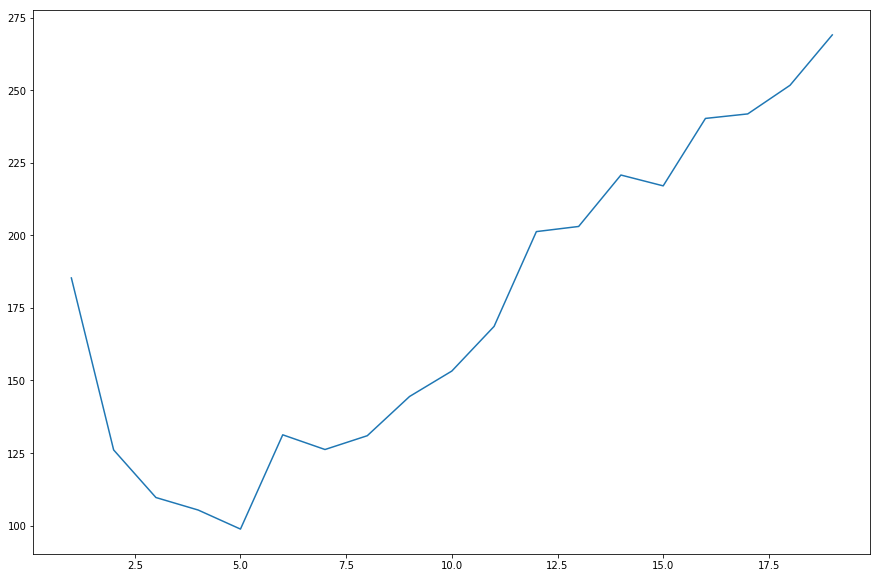

In [12]:
Y = dataF.iloc[:,7]

mseList = []
k_waarden = np.arange(1,20)

best_value_test = [0,0,0]
best_value_mse = [20000,0,0]

for k in k_waarden:
    for rs in range(0,3):
        x_train, x_test, y_train,  y_test = train_test_split(Ximp, Y,  test_size=0.33, random_state=rs)
        KNNRegY = neighbors.KNeighborsRegressor(n_neighbors=k)
        KNNRegY.fit(x_train, y_train)

        y_pred = KNNRegY.predict(x_test)
        if rs == 0:
            mseList.append(mean_squared_error(y_test, y_pred))
        '''
        
        print(f"Training score for k = {k}, rs = {rs}: {KNNRegY.score(x_train,y_train)*100}%")
        print(f"Test score for     k = {k}, rs = {rs}: {KNNRegY.score(x_test,y_test)*100}%")
        print(f"Mean Squared Error k = {k}, rs = {rs}: {mean_squared_error(y_test, y_pred)}", end = "\n\n")
        
        '''
        if best_value_test[0] < (KNNRegY.score(x_test,y_test)*100):
            best_value_test[0] = (KNNRegY.score(x_test,y_test)*100)
            best_value_test[1] = k
            best_value_test[2] = rs
        if best_value_mse[0] > (mean_squared_error(y_test, y_pred)):
            best_value_mse[0] = (mean_squared_error(y_test, y_pred))
            best_value_mse[1] = k
            best_value_mse[2] = rs
        

print(f"Beste test score:  k = {best_value_test[1]}, rs = {best_value_test[2]}: {best_value_test[0]}%") 
print(f"Beste mse score:   k = {best_value_mse[1]}, rs = {best_value_mse[2]}: {best_value_mse[0]}%")  

plt.figure(figsize=(15,10))
plt.plot(k_waarden, mseList) 

#### KNN Classificatie

##### Locatie kolom omvormen naar getallen

In [13]:
locaties = dataF.iloc[:,3]

for x in range(0, len(locaties)):
    locaties[x] = alleLokalen.index([locaties[x]])

C:\Users\jemij\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.


In [14]:
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold

X = dataF.iloc[:,8:len(dataF)]
imp = preprocessing.Imputer(missing_values='NaN', strategy='mean', axis=0, copy=True)
Ximp = imp.fit_transform(X)
Y = locaties

Y=Y.astype('int')

accList = []
k_waarden = np.arange(1,20)
best_value_test = [0,0,0]
for k in k_waarden:
    for rs in range(0,3):
        x_train, x_test, y_train,  y_test = train_test_split(Ximp, Y,  test_size=0.33, random_state=rs)
        
        KNNClas = neighbors.KNeighborsClassifier(n_neighbors=k)
        KNNClas.fit(x_train, y_train)
        y_pred = KNNClas.predict(x_test)
        
        acc = accuracy_score(y_test, y_pred)*100
        if rs == 0:
            accList.append(acc)

        kFold = KFold(n_splits=3, shuffle=True, random_state=0)
        score = cross_val_score(KNNClas, Ximp, Y, cv=kFold).mean()*100
        
        '''
        
        print(f"Cross val score for k = {k}, rs = {seed}: {score}%")
        print(f"Training score  for k = {k}, rs = {seed}: {KNNClas.score(x_train,y_train)*100}%")
        print(f"Accuracy score  for k = {k}, rs = {seed}: {acc}", end = "\n\n")
        
        '''
        if best_value_test[0] < (score):
            best_value_test[0] = (score)
            best_value_test[1] = k
            best_value_test[2] = rs 
        

print(f"Beste accuracy score:  k = {best_value_test[1]}, rs = {best_value_test[2]}: {best_value_test[0]}%") 

C:\Users\jemij\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:66: DeprecationWarning: Class Imputer is deprecated; Imputer was deprecated in version 0.20 and will be removed in 0.22. Import impute.SimpleImputer from sklearn instead.
  warnings.warn(msg, category=DeprecationWarning)


Beste accuracy score:  k = 1, rs = 0: 64.2600089968511%


### Lineare Modellen

#### Lineare Regressie

In [15]:
from sklearn.linear_model import LinearRegression 

X = dataF.iloc[:,8:len(dataF)]
imp = preprocessing.Imputer(missing_values='NaN', strategy='mean', axis=0, copy=True)
Ximp = imp.fit_transform(X)
Y = dataF.loc[:,"AbsoluutX"]

best_values = [0,0,0]
best_cross_val_score = [0,0,0]

for rs in range(0,20):
    x_train, x_test, y_train,  y_test = train_test_split(Ximp, Y,  test_size=0.33, random_state=rs)
    LinReg = LinearRegression()
    LinReg.fit(x_train, y_train)

    y_pred = LinReg.predict(x_test)
    mseList.append(mean_squared_error(y_test, y_pred))
    kFold = KFold(n_splits=3, shuffle=True, random_state=0)
    cvs = cross_val_score(LinReg, Ximp, Y, cv=kFold).mean()*100
    '''
    
    print(f"Training score for rs = {seed}: {LinReg.score(x_train,y_train)*100}%")
    print(f"Test score for     rs = {seed}: {LinReg.score(x_test,y_test)*100}%")
    print(f"Mean Squared Error rs = {seed}: {mean_squared_error(y_test, y_pred)}", end = "\n\n")
    
    '''
    
    if best_values[0] < (LinReg.score(x_test,y_test)*100):
        best_values[0] = (LinReg.score(x_test,y_test)*100)
        best_values[1] = rs
    if best_cross_val_score[0] < (cvs):
        best_cross_val_score[0] = (cvs)
        best_cross_val_score[1] = rs
        

print(f"Beste accuracy score:  rs = {best_values[1]}: {best_values[0]}%")
print(f"Beste cross val score:  rs = {best_cross_val_score[1]}: {best_cross_val_score[0]}%")        


C:\Users\jemij\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:66: DeprecationWarning: Class Imputer is deprecated; Imputer was deprecated in version 0.20 and will be removed in 0.22. Import impute.SimpleImputer from sklearn instead.
  warnings.warn(msg, category=DeprecationWarning)


Beste accuracy score:  rs = 0: 0%
Beste cross val score:  rs = 0: 0%


### XGBClassifier (Kan met NaN omgaan)

In [16]:
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

X = dataF.iloc[:,8:len(dataF)]
Y = locaties
Y = Y.astype('int')

x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size = 0.3, random_state = 1)

# fit model to training data
model = XGBClassifier()
model.fit(x_train, y_train)

# make predictions for test data
y_pred = model.predict(x_test)

# evaluate predictions
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy: %.2f%%" % (accuracy * 100.0))

Accuracy: 60.00%


### Descision Tree Classifier

In [17]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score

X = dataF.iloc[:,8:len(dataF)]
imp = preprocessing.Imputer(missing_values='NaN', strategy='mean', axis=0, copy=True)
Ximp = imp.fit_transform(X)
Y = locaties
Y=Y.astype('int')

best_cross_val_score = [0,0]

for i in range(1,20):
    x_train, x_test, y_train,  y_test = train_test_split(Ximp, Y,  test_size=0.33, random_state=0)
    DTC = DecisionTreeClassifier(max_depth = i)
    DTC = DTC.fit(x_train, y_train)
    kFold = KFold(n_splits=3, shuffle=True, random_state=0)
    cvs = cross_val_score(DTC, Ximp, Y, cv=kFold).mean()*100
    '''
    
    print(f"Cross val score: depth {i}   {cvs}%")
    print(f"Train score:     depth {i}   {DTC.score(x_train, y_train)*100}%")
    print(f"Test  score:     depth {i}   {DTC.score(x_test, y_test)*100}%", end='\n\n')
    
    '''
    if best_cross_val_score[0] < (cvs):
        best_cross_val_score[0] = (cvs)
        best_cross_val_score[1] = i
    
print(f"Beste cross validation score:  max_depth = {best_cross_val_score[1]}: {best_cross_val_score[0]}%") 

Beste cross validation score:  max_depth = 17: 59.131803868645974%


C:\Users\jemij\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:66: DeprecationWarning: Class Imputer is deprecated; Imputer was deprecated in version 0.20 and will be removed in 0.22. Import impute.SimpleImputer from sklearn instead.
  warnings.warn(msg, category=DeprecationWarning)


### Random Forest Classifier

In [18]:
from sklearn.ensemble import RandomForestClassifier
best_cross_val_score = [0,0,0]

X = dataF.iloc[:,8:len(dataF)]
imp = preprocessing.Imputer(missing_values='NaN', strategy='mean', axis=0, copy=True)
Ximp = imp.fit_transform(X)
Y = locaties
Y=Y.astype('int')

for i in range(1,15):
    for n in range(1,10):        
        x_train, x_test, y_train,  y_test = train_test_split(Ximp, Y,  test_size=0.33, random_state=0)
        
        RFC = RandomForestClassifier(n_estimators = n, max_depth = i)
        RFC = RFC.fit(x_train, y_train)
        y_pred = RFC.predict(x_test)
        
        kFold = KFold(n_splits=3, shuffle=True, random_state=0)        
        cvs = cross_val_score(DTC, Ximp, Y, cv=kFold).mean()*100
        '''
        
        print(f"Cross val score: depth {i} estimator {n}  {cvs}%")
        print(f"Train score:     depth {i} estimator {n}  {RFC.score(x_train, y_train)*100}%")
        print(f"Test  score:     depth {i} estimator {n}  {RFC.score(x_test, y_test)*100}%", end = "\n\n")
        
        '''
        if best_cross_val_score[0] < (cvs):
            best_cross_val_score[0] = (cvs)
            best_cross_val_score[1] = i
            best_cross_val_score[2] = n

print(f"Beste cross validation score:  max_depth = {best_cross_val_score[1]} e_estimator = {best_cross_val_score[2]}: {best_cross_val_score[0]}%") 
        

C:\Users\jemij\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:66: DeprecationWarning: Class Imputer is deprecated; Imputer was deprecated in version 0.20 and will be removed in 0.22. Import impute.SimpleImputer from sklearn instead.
  warnings.warn(msg, category=DeprecationWarning)


Beste cross validation score:  max_depth = 2 e_estimator = 7: 60.00899685110211%


### Neural Network: MLPClassifier

In [19]:
'''


from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import GridSearchCV

param_grid = {'hidden_layer_sizes': range(100,1001,100),
              'alpha': [0.0001,0.001,0.01,0.1,1],
              'activation' : ['identity', 'logistic', 'tanh', 'relu'],
              'solver' : ['lbfgs', 'sgd', 'adam'],
              'max_iter' : range(100,1001,100),}

grid_search = GridSearchCV(MLPClassifier(), param_grid, cv=5, return_train_score=True)
# do not overfit the parameters !
X_train, X_test, y_train, y_test = train_test_split(Ximp, Y, random_state=0)
grid_search.fit(X_train, y_train)
print("Test set score: {:.2f}".format(grid_search.score(X_test, y_test)))
print("Best parameters: {}".format(grid_search.best_params_))
print("Best cross-validation score: {:.2f}".format(grid_search.best_score_))
print("Best estimator:\n{}".format(grid_search.best_estimator_))


'''

'\n\n\nfrom sklearn.neural_network import MLPClassifier\nfrom sklearn.model_selection import GridSearchCV\n\nparam_grid = {\'hidden_layer_sizes\': range(100,1001,100),\n              \'alpha\': [0.0001,0.001,0.01,0.1,1],\n              \'activation\' : [\'identity\', \'logistic\', \'tanh\', \'relu\'],\n              \'solver\' : [\'lbfgs\', \'sgd\', \'adam\'],\n              \'max_iter\' : range(100,1001,100),}\n\ngrid_search = GridSearchCV(MLPClassifier(), param_grid, cv=5, return_train_score=True)\n# do not overfit the parameters !\nX_train, X_test, y_train, y_test = train_test_split(Ximp, Y, random_state=0)\ngrid_search.fit(X_train, y_train)\nprint("Test set score: {:.2f}".format(grid_search.score(X_test, y_test)))\nprint("Best parameters: {}".format(grid_search.best_params_))\nprint("Best cross-validation score: {:.2f}".format(grid_search.best_score_))\nprint("Best estimator:\n{}".format(grid_search.best_estimator_))\n\n\n'

In [20]:
from sklearn.neural_network import MLPClassifier

X = dataF.iloc[:,8:len(dataF)]
imp = preprocessing.Imputer(missing_values='NaN', strategy='mean', axis=0, copy=True)
Ximp = imp.fit_transform(X)
Y = locaties
Y = Y.astype('int')
MLP = MLPClassifier(activation='logistic', alpha=0.0001, batch_size='auto',
              beta_1=0.9, beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=200, learning_rate='constant',
              learning_rate_init=0.001, max_iter=600, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)

cvs = cross_val_score(MLP, Ximp, Y, cv=kFold).mean()*100

print(cvs)

C:\Users\jemij\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:66: DeprecationWarning: Class Imputer is deprecated; Imputer was deprecated in version 0.20 and will be removed in 0.22. Import impute.SimpleImputer from sklearn instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\jemij\Anaconda3\lib\site-packages\sklearn\neural_network\multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


62.55060728744939


C:\Users\jemij\Anaconda3\lib\site-packages\sklearn\neural_network\multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


## 2e Dataset

In [21]:
with open("./project2.txt") as file1:
    data=[x for x in file1]
    
data = [x for x in data]
data = [x.replace(" ", "") for x in data]
data = [x.split("&") for x in data]

macCount = {}
dataLoD = []
minSterkte = 200
maxSterkte = 0
            
for x in data:
    datapunt = {}
    
    for y, iter2 in zip(x, range(1,5)):
        if iter2 == 1:
            datapunt["Date"] = y[5:10]
            datapunt[ y[:4] ] = y[10:]
            
        elif iter2 == 2:
            datapunt[y[:6]] = y[7:]
            
        elif iter2 == 3:
            datapunt[y[:8]] = y[y.index("=")+1:y.index("@")]
            datapunt[str(y[:8]) + "X"] = float(y[y.index("@")+1:y.index(";")])
            datapunt[str(y[:8]) + "Y"] = float(y[y.index(";")+1:])
            
        elif iter2 == 4:
            y = y.split(",")
            y[0] = y[0].replace("WifiInfo=", "")
            y[len(y)-1] = y[len(y)-1].replace("\n", "")
                       
            for z,iter3 in zip(y, range(1,len(y)+1)):
                sterkte = int(z[z.index(":")+2:])
                
                if sterkte > maxSterkte:
                    maxSterkte = sterkte
                if sterkte < minSterkte:
                    minSterkte = sterkte
                    
                if z[z.index("@")+1:z.index(":")] not in macCount:
                    macCount[z[z.index("@")+1:z.index(":")]] = 1
                else:
                    macCount[z[z.index("@")+1:z.index(":")]] += 1
                                
                datapunt[z[z.index("@")+1:z.index(":")] ] = int(z[z.index(":")+2:])
       
    dataLoD.append(datapunt)

for x in dataLoD:
    for y in macCount.keys():
        if y not in x:
            x[y] = np.NaN 
    
dataF = pd.DataFrame(dataLoD)

frontColumns = dataF[["Time", "Date", "Sender", "Location", "LocationX", "LocationY"]]
backColumns = dataF.drop(columns = ["Time", "Date", "Sender", "Location", "LocationX", "LocationY"])
dataF = pd.concat([frontColumns, backColumns], axis=1, sort=False)

display(dataF)

,Time,Date,Sender,Location,LocationX,LocationY,00-1d-6a-a4-ae-6a,00-1e-94-02-1e-c0,00-78-9e-69-a6-bb,00-95-69-a9-04-45,...,aa-db-03-0b-ab-39,b0-4e-26-b0-8e-8a,c8-d7-19-6f-be-b7,dc-53-7c-45-b1-3f,dc-53-7c-45-b1-40,dc-53-7c-85-46-82,de-53-3c-de-e7-c6,e0-b9-e5-e4-5e-0b,e2-b9-e5-e4-5e-0e,fa-8f-ca-57-5f-57
0,06:08:41,12/03,44:6E:E5:C5:8F:4F,gang,0.65625,0.04449,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,87.0,NaN,NaN,NaN,NaN
1,06:08:53,12/03,44:6E:E5:C5:8F:4F,gang,0.61875,0.13758,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,87.0,NaN,NaN,NaN,NaN
2,06:09:03,12/03,44:6E:E5:C5:8F:4F,gang,0.26250,0.13826,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,82.0,NaN,NaN,NaN,NaN
3,06:09:17,12/03,44:6E:E5:C5:8F:4F,gang,0.63333,0.31006,NaN,NaN,NaN,NaN,...,NaN,85.0,NaN,NaN,NaN,82.0,NaN,NaN,NaN,NaN
4,06:09:41,12/03,44:6E:E5:C5:8F:4F,gang,0.63958,0.49555,NaN,NaN,NaN,NaN,...,NaN,85.0,NaN,NaN,NaN,86.0,NaN,NaN,NaN,NaN
5,06:09:58,12/03,44:6E:E5:C5:8F:4F,gang,0.64167,0.61602,NaN,NaN,NaN,NaN,...,NaN,85.0,NaN,NaN,NaN,86.0,NaN,NaN,NaN,NaN
6,06:10:14,12/03,44:6E:E5:C5:8F:4F,gang,0.64688,0.78371,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,82.0,NaN,NaN,NaN,NaN
7,06:10:27,12/03,44:6E:E5:C5:8F:4F,gang,0.64792,0.93018,NaN,NaN,NaN,NaN,...,NaN,83.0,NaN,NaN,NaN,82.0,NaN,NaN,NaN,NaN
8,06:10:38,12/03,44:6E:E5:C5:8F:4F,gang,0.32604,0.96988,NaN,NaN,NaN,NaN,...,NaN,81.0,NaN,NaN,NaN,81.0,NaN,NaN,NaN,NaN
9,06:11:02,12/03,44:6E:E5:C5:8F:4F,docenten,0.26146,0.64545,NaN,NaN,NaN,NaN,...,NaN,85.0,NaN,NaN,NaN,81.0,NaN,NaN,NaN,NaN


De minimum sterkte is: 28
De maximum sterkte is: 95
             Mac_Adres  Aantal
8    58-6d-8f-19-14-38     202
9    58-6d-8f-19-10-fc     201
19   58-6d-8f-19-13-f4     177
52   58-6d-8f-19-11-48     176
17   88-1d-fc-41-dc-51     167
3    88-1d-fc-30-d4-42     166
10   88-1d-fc-41-dc-50     165
12   88-1d-fc-41-dc-53     164
11   88-1d-fc-41-dc-52     164
0    88-1d-fc-30-d4-40     163
6    88-1d-fc-30-d4-41     162
1    88-1d-fc-30-d4-43     156
76   88-1d-fc-30-d4-4d     140
77   88-1d-fc-30-d4-4e     140
78   88-1d-fc-30-d4-4c     138
75   88-1d-fc-30-d4-4f     137
65   88-1d-fc-41-dc-5f     136
67   88-1d-fc-41-dc-5e     135
28   88-1d-fc-44-9c-20     131
66   88-1d-fc-41-dc-5d     129
27   88-1d-fc-44-9c-22     129
68   88-1d-fc-41-dc-5c     128
29   88-1d-fc-44-9c-21     127
26   88-1d-fc-44-9c-23     126
72   88-1d-fc-44-9c-2e      96
73   88-1d-fc-44-9c-2c      95
70   88-1d-fc-44-9c-2d      94
71   88-1d-fc-44-9c-2f      92
16   dc-53-7c-85-46-82      82
124  c8-d7-19-6f-b

[]

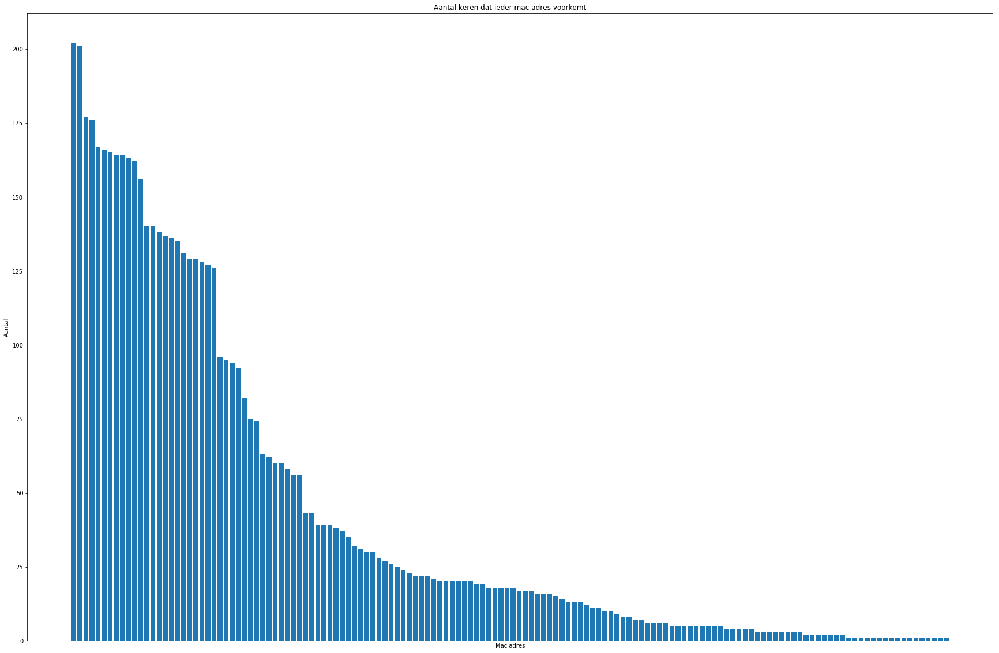

In [22]:
print(f"De minimum sterkte is: {minSterkte}")
print(f"De maximum sterkte is: {maxSterkte}")

MacCountP = pd.DataFrame(list(macCount.items()), columns = ["Mac_Adres", "Aantal"])
SortedMacCount = MacCountP.sort_values(["Aantal"], ascending = False)
print(SortedMacCount)

plt.figure(figsize = (30,20))
plt.bar(SortedMacCount.Mac_Adres, SortedMacCount.Aantal)
#Ik haal de tekst weg van de x-as omdat het niet leesbaar is.
barChart = plt.gca()
barChart.axes.get_xaxis().set_ticks([])
plt.xlabel("Mac adres")
plt.ylabel("Aantal")
plt.title("Aantal keren dat ieder mac adres voorkomt")
plt.plot()

In [23]:
AbsoluutX = []
AbsoluutY = []
lokalen = dataF[["Location"]]

for x1, y1, lokaal in zip(dataF[["LocationX"]].values, dataF[["LocationY"]].values, lokalen.values):
    if lokaal == ["K.VanAssche"]:
        AbsoluutX.append(129.333 * x1[0])
        AbsoluutY.append(128.333 * y1[0])
    
    elif lokaal == ["P.Demeester"]:
        AbsoluutX.append(129.333 * x1[0])
        AbsoluutY.append(((256.667 - 128.333) * y1[0]) + 128.333)
    
    elif lokaal == ["Datacenter"]:
        y1[0] = 1-y1[0]
        AbsoluutX.append(((253 - 129.333) * y1[0]) + 129.333)
        AbsoluutY.append(78 * x1[0])
    
    elif lokaal == ["D036"]:
        y1[0] = 1-y1[0]
        AbsoluutX.append(((253 - 129.333) *  y1[0]) + 129.333)
        AbsoluutY.append(((256.667 - 163) *x1[0]) + 163)
    
    elif lokaal == ["lab1"]:
        AbsoluutX.append(((568 - 341.333) * x1[0]) + 341.333)
        AbsoluutY.append(((343.333 - 52.333) * y1[0]) + 52.333)
        
    elif lokaal == ["lab2"]:
        AbsoluutX.append(((568 - 341.333) * x1[0]) + 341.333)
        AbsoluutY.append(((634.333 - 343.333) * y1[0]) + 343.333)
        
    elif lokaal == ["lab3"]:
        AbsoluutX.append(((568 - 341.333) * x1[0]) + 341.333)
        AbsoluutY.append(((943.5 - 634.333) * y1[0]) + 634.333)
    
    elif lokaal == ["lab4"]:
        AbsoluutX.append(253 * x1[0])
        AbsoluutY.append(((505 - 256.667) * y1[0]) + 256.667)
    
    elif lokaal == ["lab5"]:
        AbsoluutX.append(253 * x1[0])
        AbsoluutY.append(((724.25 - 505) * y1[0]) + 505)
    
    elif lokaal == ["lab6"]:
        AbsoluutX.append(253 * x1[0])
        AbsoluutY.append(((943.5 - 724.25) * y1[0]) + 724.25)
    
    elif lokaal == ["projectlokaal"]:
        AbsoluutX.append(((253 - 55.333) * x1[0]) + 55.333)
        AbsoluutY.append(((1193 - 1004.917) * y1[0]) + 1004.917)
        
    elif lokaal == ["docenten"]:
        y1[0] = 1-y1[0]
        AbsoluutX.append(((568 - 253) * y1[0]) + 253)
        AbsoluutY.append(((1193 - 943.5) * x1[0]) + 943.5)
        
    elif lokaal == ["gang"]:
        AbsoluutX.append(((341.333 - 253) * x1[0]) + 253)
        AbsoluutY.append(1004.917 * y1[0])
        
absX = pd.DataFrame(AbsoluutX, columns=["AbsoluutX"]).apply(lambda x: x/568)
absY = pd.DataFrame(AbsoluutY, columns=["AbsoluutY"]).apply(lambda x: x/1193)


dataF = pd.concat([frontColumns, absX, absY, backColumns], axis=1, sort=False)
dataF

,Time,Date,Sender,Location,LocationX,LocationY,AbsoluutX,AbsoluutY,00-1d-6a-a4-ae-6a,00-1e-94-02-1e-c0,...,aa-db-03-0b-ab-39,b0-4e-26-b0-8e-8a,c8-d7-19-6f-be-b7,dc-53-7c-45-b1-3f,dc-53-7c-45-b1-40,dc-53-7c-85-46-82,de-53-3c-de-e7-c6,e0-b9-e5-e4-5e-0b,e2-b9-e5-e4-5e-0e,fa-8f-ca-57-5f-57
0,06:08:41,12/03,44:6E:E5:C5:8F:4F,gang,0.65625,0.04449,0.547480,0.037476,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,87.0,NaN,NaN,NaN,NaN
1,06:08:53,12/03,44:6E:E5:C5:8F:4F,gang,0.61875,0.13758,0.541648,0.115890,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,87.0,NaN,NaN,NaN,NaN
2,06:09:03,12/03,44:6E:E5:C5:8F:4F,gang,0.26250,0.13826,0.486245,0.116463,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,82.0,NaN,NaN,NaN,NaN
3,06:09:17,12/03,44:6E:E5:C5:8F:4F,gang,0.63333,0.31006,0.543915,0.261177,NaN,NaN,...,NaN,85.0,NaN,NaN,NaN,82.0,NaN,NaN,NaN,NaN
4,06:09:41,12/03,44:6E:E5:C5:8F:4F,gang,0.63958,0.49555,0.544887,0.417424,NaN,NaN,...,NaN,85.0,NaN,NaN,NaN,86.0,NaN,NaN,NaN,NaN
5,06:09:58,12/03,44:6E:E5:C5:8F:4F,gang,0.64167,0.61602,0.545212,0.518901,NaN,NaN,...,NaN,85.0,NaN,NaN,NaN,86.0,NaN,NaN,NaN,NaN
6,06:10:14,12/03,44:6E:E5:C5:8F:4F,gang,0.64688,0.78371,0.546023,0.660154,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,82.0,NaN,NaN,NaN,NaN
7,06:10:27,12/03,44:6E:E5:C5:8F:4F,gang,0.64792,0.93018,0.546184,0.783532,NaN,NaN,...,NaN,83.0,NaN,NaN,NaN,82.0,NaN,NaN,NaN,NaN
8,06:10:38,12/03,44:6E:E5:C5:8F:4F,gang,0.32604,0.96988,0.496127,0.816973,NaN,NaN,...,NaN,81.0,NaN,NaN,NaN,81.0,NaN,NaN,NaN,NaN
9,06:11:02,12/03,44:6E:E5:C5:8F:4F,docenten,0.26146,0.64545,0.642048,0.845544,NaN,NaN,...,NaN,85.0,NaN,NaN,NaN,81.0,NaN,NaN,NaN,NaN


In [24]:
lokalen = dataF[["Location"]]
alleLokalen = []
dictLokalen = {}
kleuren = ["red", "blue", "navy", "tomato", "green", "yellow", "k", "tan", "gold", "aqua", "pink","limegreen","lime","slateblue"]

for i in lokalen.values.tolist():
    if i not in alleLokalen:
        alleLokalen.append(i)

for lokaal, kleur in zip(alleLokalen, kleuren):
    dictLokalen[lokaal[0]] = kleur


C:\Users\jemij\Anaconda3\lib\site-packages\matplotlib\figure.py:98: MatplotlibDeprecationWarning: 
Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  "Adding an axes using the same arguments as a previous axes "


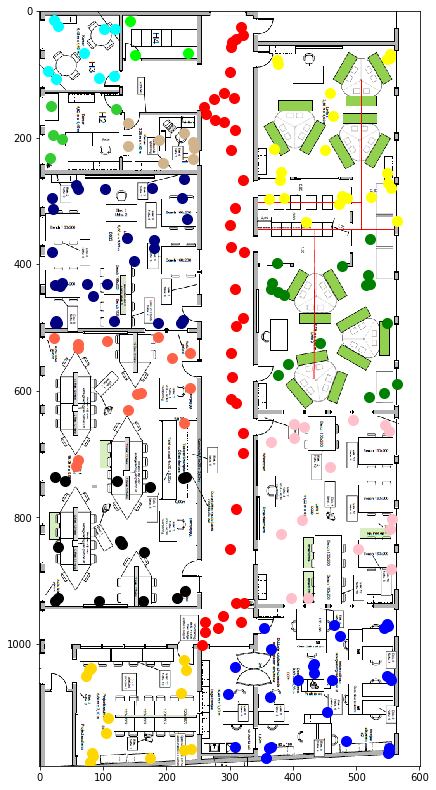

gang red 39
docenten blue 27
lab4 navy 27
lab5 tomato 14
lab2 green 17
lab1 yellow 22
lab6 k 16
D036 tan 8
projectlokaal gold 14
K.VanAssche aqua 9
lab3 pink 16
P.Demeester limegreen 5
Datacenter lime 3


In [25]:
imgpath = "./images/ikdoeict180Rotated.png"
img = plt.imread(imgpath)

fig = plt.figure(figsize=(15,30))
ax1 = fig.add_subplot(1, 2, 1)
ax2 = fig.add_subplot(1, 2, 1)

# Coördinaten omzetten naar waarden die overeenkomen met de afbeelding van 568px * 1193px
absX[['AbsoluutX']] = absX[['AbsoluutX']].apply(lambda x: x*568)
absY[['AbsoluutY']] = absY[['AbsoluutY']].apply(lambda x: x*1193)

ax1.imshow(img)

for a, b, lokaal in zip(absX.values,absY.values,lokalen.values):
    kleur = dictLokalen.get(lokaal[0])
    ax2.scatter(a, b, c=kleur, s=100)

plt.show()
    
lokaalCount = {}    
for lokaal in lokalen.values:
    if lokaal[0] not in lokaalCount:
        lokaalCount[f"{lokaal[0]}"] = 1
    else:
        lokaalCount[f"{lokaal[0]}"] += 1

for key, kleur, aantal in zip(lokaalCount.keys(), kleuren, lokaalCount.values()):
    print(key, kleur, aantal)

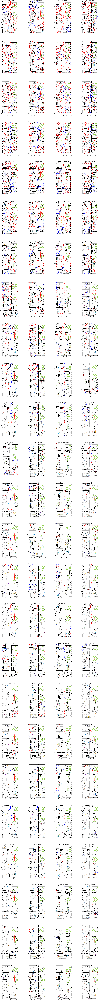

In [26]:
fig = plt.figure(figsize=(40,400))
ax = []

for x in np.arange(1,101):
    ax.append(fig.add_subplot(25, 4, x))

for x in np.arange(0,100):
    ax[x].imshow(img)
    ax[x].scatter(absX,absY, c = dataF[[f"{SortedMacCount.iloc[x,0]}"]].values.tolist(), cmap = "seismic", s = 200)
    ax[x].set_title(f"{SortedMacCount.iloc[x,0]} # of locations: {SortedMacCount.iloc[x,1]} ")

plt.show()

In [27]:
locaties2 = dataF.iloc[:,3]

for x in range(0, len(locaties2)):
    locaties2[x] = alleLokalen.index([f"{locaties2[x]}"])

C:\Users\jemij\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.


In [28]:
senderStr = dataF.iloc[:,2]
senderInt = []
allSenders = {}
iter1 = 0
for x in senderStr.values.tolist():
    if x not in allSenders:
        allSenders[x] = iter1
        iter1 += 1

for x, iter1 in zip(senderStr.values.tolist(), range(0, len(senderStr))):
    senderInt.append(allSenders[x])

senderInt = pd.DataFrame(senderInt, columns= ['SenderInt'])

### XGBoost Classifier

In [29]:
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV

X = dataF.iloc[:,8:]


X = pd.concat([senderInt, X], axis = 1, sort = False)
Yclass = locaties2.astype("int")

x_train, x_test, y_train, y_test = train_test_split(X, Yclass, test_size = 0.3, random_state = 0)

model = XGBClassifier(gamma = 0, 
                      subsample = 0.8, 
                      colsample_bytree = 0.8,
                      objective = 'multi:logistic', 
                      nthread = 4, 
                      scale_pos_weight = 1,
                      min_child_weight = 1,
                      cv = 4,
                      n_estimators = 150)

model.fit(x_train, y_train)
y_pred = model.predict(x_test)

# evaluate predictions
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy * 100.0}%")


param_grid1 = {'max_depth':range(1, 11, 2),
               'learning_rate' : np.arange(0.01, 0.1,  0.03),
               'seed': np.arange(1, 51, 10)}
grid1 = GridSearchCV(estimator = model, param_grid = param_grid1, n_jobs = -1, verbose = 10)

grid1.fit(x_train, y_train)

print(f"Beste score:       {grid1.best_score_}")
print(f"Beste parameters:  {grid1.best_params_}")

Accuracy: 81.81818181818183%
Fitting 3 folds for each of 100 candidates, totalling 300 fits


C:\Users\jemij\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARNING, FutureWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:   14.9s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:   18.3s
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:   26.3s
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:   33.3s
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:   41.5s
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   48.4s
[Parallel(n_jobs=-1)]: Done  53 tasks      | elapsed:   57.9s
[Parallel(n_jobs=-1)]: Done  64 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done  77 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done  90 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 105 tasks      | elapse

Beste score:       0.8079470198675497
Beste parameters:  {'learning_rate': 0.09999999999999999, 'max_depth': 3, 'seed': 1}


### XGBoost Regeressor

In [30]:
from xgboost import XGBRegressor

Y = dataF[["AbsoluutX"]]
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size = 0.3, random_state = 1)

model = XGBRegressor( gamma=0, 
                      subsample=0.8, 
                      colsample_bytree=0.8,
                      objective= 'reg:logistic', 
                      nthread=4, 
                      scale_pos_weight=1, 
                      seed=29)
model.fit(x_train, y_train)

y_pred = model.predict(x_test)

# evaluate predictions
accuracy = mean_squared_error(y_test, y_pred)
print("Accuracy: %.2f%%" % (accuracy * 100.0))

param_grid1 = {'max_depth':range(1, 10, 2),
               'min_child_weight':range(1, 6, 2),
               'learning_rate' : np.arange(0.1,  1.0,  0.1),
               'n_estimators' : np.arange(50, 301, 50)}

grid1 = GridSearchCV(estimator = model, param_grid = param_grid1, n_jobs = -1, verbose = 10)
grid1.fit(X, Y)

print(grid1.best_score_)
print(grid1.best_params_)

Accuracy: 1.83%
Fitting 3 folds for each of 810 candidates, totalling 2430 fits


C:\Users\jemij\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARNING, FutureWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1247s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done  58 tasks      | elapsed:    5.1s
[Parallel(n_jobs=-1)]: Batch computation too slow (2.1017s.) Setting batch_size=1.
[Parallel(n_jobs=-1)]: Done  76 tasks      | elapsed:    7.6s
[Parallel(n_jobs=-1)]: Done  93 tasks      | elapsed:    9.7s
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:   11.3s
[Parallel

KeyboardInterrupt: 

In [ ]:
from sklearn.preprocessing import normalize
from sklearn.impute import SimpleImputer

X = dataF.iloc[:,8:]
imp = SimpleImputer(missing_values=np.NaN, strategy='constant', fill_value = 28, copy=True)
X = imp.fit_transform(X)

X = normalize(X, norm='l2', axis=1, copy=True, return_norm=False)
X = pd.DataFrame(X)
    

Yclass = locaties2.astype('int')

### KNN Classificatie

In [ ]:
k_param_grid = {"n_neighbors" : range(1,20) , "weights" : ["uniform", 'distance']}

grid_search = GridSearchCV(neighbors.KNeighborsClassifier(), k_param_grid, cv=3, return_train_score=True)

# do not overfit the parameters !
X_train, X_test, y_train, y_test = train_test_split(X, Yclass, random_state=0)
grid_search.fit(X_train, y_train)

print("Test set score: {:.2f}".format(grid_search.score(X_test, y_test)))
print("Best parameters: {}".format(grid_search.best_params_))
print("Best cross-validation score: {:.2f}".format(grid_search.best_score_))
print("Best estimator:\n{}".format(grid_search.best_estimator_))

### KNN Regressie Voor X Coördinaat

In [ ]:
Y = dataF[["AbsoluutX"]]

k_param_grid = {"n_neighbors" : range(1,20)}

grid_search = GridSearchCV(neighbors.KNeighborsRegressor(), k_param_grid, cv=4, return_train_score=True)

# do not overfit the parameters !
X_train, X_test, y_train, y_test = train_test_split(Ximp, Y, random_state=0)
grid_search.fit(X_train, y_train)

print("Test set score: {:.2f}".format(grid_search.score(X_test, y_test)))
print("Best parameters: {}".format(grid_search.best_params_))
print("Best cross-validation score: {:.2f}".format(grid_search.best_score_))
print("Best estimator:\n{}".format(grid_search.best_estimator_))

In [ ]:
Y = dataF[["AbsoluutY"]]

k_param_grid = {"n_neighbors" : range(1,20)}

grid_search = GridSearchCV(neighbors.KNeighborsRegressor(), k_param_grid, cv=4, return_train_score=True)

# do not overfit the parameters !
X_train, X_test, y_train, y_test = train_test_split(X, Y, random_state=0)
grid_search.fit(X_train, y_train)

print("Test set score: {:.2f}".format(grid_search.score(X_test, y_test)))
print("Best parameters: {}".format(grid_search.best_params_))
print("Best cross-validation score: {:.2f}".format(grid_search.best_score_))
print("Best estimator:\n{}".format(grid_search.best_estimator_))

### Logistic Regression

In [ ]:
from sklearn.linear_model import LogisticRegression

LR_param_grid = {"penalty" : ['l1', 'l2'],  'C' : np.arange(0.1, 2.1, 0.2) }

#'solver' :  ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'] 

grid_search = GridSearchCV(LogisticRegression(n_jobs = -1), LR_param_grid, cv=3, return_train_score=True)

# do not overfit the parameters !
X_train, X_test, y_train, y_test = train_test_split(X,Yclass, random_state=0)
grid_search.fit(X_train, y_train)

print("Test set score: {:.2f}".format(grid_search.score(X_test, y_test)))
print("Best parameters: {}".format(grid_search.best_params_))
print("Best cross-validation score: {:.2f}".format(grid_search.best_score_))
print("Best estimator:\n{}".format(grid_search.best_estimator_))

### Random Forest Classifier

In [ ]:
from sklearn.ensemble import RandomForestClassifier

RFC_param_grid = {"max_depth" : range(1,20,5), 'n_estimators' : range(10, 201, 50) }

grid_search = GridSearchCV(RandomForestClassifier(n_jobs = -1), RFC_param_grid, cv=3, return_train_score=True, verbose = 1)

# do not overfit the parameters !
X_train, X_test, y_train, y_test = train_test_split(X, Yclass, random_state=0)
grid_search.fit(X_train, y_train)

print("Test set score: {:.2f}".format(grid_search.score(X_test, y_test)))
print("Best parameters: {}".format(grid_search.best_params_))
print("Best cross-validation score: {:.2f}".format(grid_search.best_score_))
print("Best estimator:\n{}".format(grid_search.best_estimator_))

In [ ]:
from sklearn.tree import DecisionTreeClassifier

param_grid = {'max_depth': range(6,20)}

grid_search = GridSearchCV(DecisionTreeClassifier(), param_grid, cv=3, return_train_score=True)

# do not overfit the parameters !
X_train, X_test, y_train, y_test = train_test_split(X, Yclass, random_state=0)
grid_search.fit(X_train, y_train)

print("Test set score: {:.2f}".format(grid_search.score(X_test, y_test)))
print("Best parameters: {}".format(grid_search.best_params_))
print("Best cross-validation score: {:.2f}".format(grid_search.best_score_))
print("Best estimator:\n{}".format(grid_search.best_estimator_))   
print("Best index:\n{}".format(grid_search.best_index_))   



### Multi Layer Perceptron Classifier

In [ ]:
from sklearn.neural_network import MLPClassifier

X = dataF.iloc[:,8:]
imp = preprocessing.Imputer(missing_values='NaN', strategy='mean', axis=0, copy=True)
X = imp.fit_transform(X)
Y = locaties.astype('int')

param_grid = {'hidden_layer_sizes': range(100, 12000,500),
              'max_iter' : range(400, 1001, 100),
               "activation" : ["logistic"]}

grid_search = GridSearchCV(MLPClassifier(), param_grid, cv=3, return_train_score=True, verbose=10)

# do not overfit the parameters !
X_train, X_test, y_train, y_test = train_test_split(X, Yclass, random_state=0)
grid_search.fit(X_train, y_train)

print("Test set score: {:.2f}".format(grid_search.score(X_test, y_test)))
print("Best parameters: {}".format(grid_search.best_params_))
print("Best cross-validation score: {:.2f}".format(grid_search.best_score_))
print("Best estimator:\n{}".format(grid_search.best_estimator_))

### Multi Layer Perceptron Regression

In [ ]:
from sklearn.neural_network import MLPRegressor

X = dataF.iloc[:,8:116]
Y = dataF.iloc[:,6]
imp = preprocessing.Imputer(missing_values='NaN', strategy='median', axis=0, copy=True)
Ximp = imp.fit_transform(X)

param_grid = {'hidden_layer_sizes': range(1,12000,100),
              'max_iter' : range(400,1001, 100)}

grid_search = GridSearchCV(MLPRegressor(activation = 'logistic'), param_grid, cv=3, return_train_score=True)

# do not overfit the parameters !
X_train, X_test, y_train, y_test = train_test_split(Ximp, Y, random_state=0)
grid_search.fit(X_train, y_train)

print("Test set score: {:.2f}".format(grid_search.score(X_test, y_test)))
print("Best parameters: {}".format(grid_search.best_params_))
print("Best cross-validation score: {:.2f}".format(grid_search.best_score_))
print("Best estimator:{}".format(grid_search.best_estimator_))

## 3e Dataset

### Alle Data In Een Dataframe Stoppen

In [41]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

with open("./project3.txt") as file1:
    data=[x for x in file1]
    
data = [x for x in data]
data = [x.replace(" ", "") for x in data]
data = [x.split("&") for x in data]

macCount = {}
dataLoD = []
minSterkte = 200
maxSterkte = 0
           
for x in data:
    datapunt = {}
    
    for y, iter2 in zip(x, range(1,5)):
        if iter2 == 1:
            datapunt["Date"] = y[5:10]
            datapunt[ y[:4] ] = y[10:]
           
        elif iter2 == 2:
            datapunt[y[:6]] = y[7:]
            
        elif iter2 == 3:
            datapunt[y[:8]] = y[y.index("=")+1:y.index("@")]
            datapunt[str(y[:8]) + "X"] = float(y[y.index("@")+1:y.index(";")])
            datapunt[str(y[:8]) + "Y"] = float(y[y.index(";")+1:])
            
        elif iter2 == 4:
            y = y.split(",")
            y[0] = y[0].replace("WifiInfo=", "")
            y[len(y)-1] = y[len(y)-1].replace("\n", "")
                       
            for z,iter3 in zip(y, range(1,len(y)+1)):
                sterkte = int(z[z.index(":")+2:])
                if sterkte > maxSterkte:
                    maxSterkte = sterkte
                if sterkte < minSterkte:
                    minSterkte = sterkte
                    
                if z[z.index("@")+1:z.index(":")] not in macCount:
                    macCount[z[z.index("@")+1:z.index(":")]] = 1
                else:
                    macCount[z[z.index("@")+1:z.index(":")]] += 1
                                
                datapunt[z[z.index("@")+1:z.index(":")] ] = int(z[z.index(":")+2:])
       
    dataLoD.append(datapunt)

for x in dataLoD:
    for y in macCount.keys():
        if y not in x:
            x[y] = np.NaN 
    
dataF = pd.DataFrame(dataLoD)

frontColumns = dataF[["Time", "Date", "Sender", "Location", "LocationX", "LocationY"]]
backColumns = dataF.drop(columns = ["Time", "Date", "Sender", "Location", "LocationX", "LocationY"])
dataF = pd.concat([frontColumns, backColumns], axis=1, sort=False)

dataF.head(5)

,Time,Date,Sender,Location,LocationX,LocationY,00-19-70-24-26-ab,00-1d-6a-a4-ae-6a,00-1e-94-02-0f-28,00-1e-94-02-1e-c0,...,dc-53-7c-de-e7-c6,dc-53-7c-e1-c2-0f,de-53-3c-de-e7-c6,de-53-3c-e1-c2-0f,e0-b9-e5-e4-5e-0b,e2-b9-e5-e4-5e-0e,fa-8f-ca-57-5f-57,fa-8f-ca-62-b9-1c,fa-8f-ca-65-c3-70,fa-8f-ca-82-ea-e2
0,06:08:41,12/03,44:6E:E5:C5:8F:4F,gang,0.65625,0.04449,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,06:08:53,12/03,44:6E:E5:C5:8F:4F,gang,0.61875,0.13758,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,06:09:03,12/03,44:6E:E5:C5:8F:4F,gang,0.26250,0.13826,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,06:09:17,12/03,44:6E:E5:C5:8F:4F,gang,0.63333,0.31006,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,06:09:41,12/03,44:6E:E5:C5:8F:4F,gang,0.63958,0.49555,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Algemene Info Over De Data

De minimum sterkte is: 23
De maximum sterkte is: 96
             Mac_Adres  Aantal
8    58-6d-8f-19-14-38     398
9    58-6d-8f-19-10-fc     389
52   58-6d-8f-19-11-48     342
3    88-1d-fc-30-d4-42     339
0    88-1d-fc-30-d4-40     338
1    88-1d-fc-30-d4-43     327
6    88-1d-fc-30-d4-41     319
19   58-6d-8f-19-13-f4     308
17   88-1d-fc-41-dc-51     293
10   88-1d-fc-41-dc-50     293
12   88-1d-fc-41-dc-53     292
11   88-1d-fc-41-dc-52     292
28   88-1d-fc-44-9c-20     273
29   88-1d-fc-44-9c-21     265
27   88-1d-fc-44-9c-22     264
124  c8-d7-19-6f-be-b7     260
26   88-1d-fc-44-9c-23     257
76   88-1d-fc-30-d4-4d     140
77   88-1d-fc-30-d4-4e     140
78   88-1d-fc-30-d4-4c     138
75   88-1d-fc-30-d4-4f     137
65   88-1d-fc-41-dc-5f     136
67   88-1d-fc-41-dc-5e     135
24   68-15-90-04-4b-50     130
66   88-1d-fc-41-dc-5d     129
68   88-1d-fc-41-dc-5c     128
16   dc-53-7c-85-46-82     116
14   88-1d-fc-2c-c0-03     105
163  94-91-7f-5a-20-d2     103
164  96-91-7f-5a-2

[]

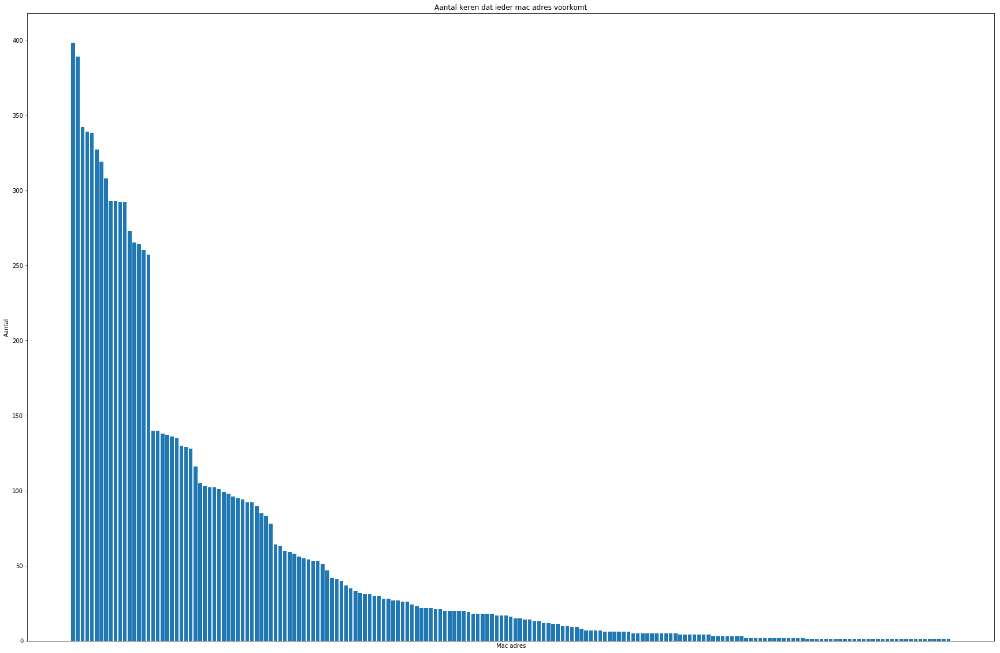

In [32]:
print(f"De minimum sterkte is: {minSterkte}")
print(f"De maximum sterkte is: {maxSterkte}")

MacCountP = pd.DataFrame(list(macCount.items()), columns = ["Mac_Adres", "Aantal"])
SortedMacCount = MacCountP.sort_values(["Aantal"], ascending = False)
print(SortedMacCount)

plt.figure(figsize = (30,20))
plt.bar(SortedMacCount.Mac_Adres, SortedMacCount.Aantal)
#Ik haal de tekst weg van de x-as omdat het niet leesbaar is.
barChart = plt.gca()
barChart.axes.get_xaxis().set_ticks([])
plt.xlabel("Mac adres")
plt.ylabel("Aantal")
plt.title("Aantal keren dat ieder mac adres voorkomt")
plt.plot()

### De Locaties Met Relatieve Coördinaten Omvormen Naar Absolute Coördinaten

In [ ]:
imgpath = "./images/ikdoeict_Coordinaten.png"
img = plt.imread(imgpath)
plt.figure(figsize=(20,40))
plt.imshow(img)

In [42]:
AbsoluutX = []
AbsoluutY = []
lokalen = dataF[["Location"]]

for x1, y1, lokaal in zip(dataF[["LocationX"]].values, dataF[["LocationY"]].values, lokalen.values):
    if lokaal == ["K.VanAssche"]:
        AbsoluutX.append(129.333 * x1[0])
        AbsoluutY.append(128.333 * y1[0])
    
    elif lokaal == ["P.Demeester"]:
        AbsoluutX.append(129.333 * x1[0])
        AbsoluutY.append(((256.667 - 128.333) * y1[0]) + 128.333)
    
    elif lokaal == ["Datacenter"]:
        y1[0] = 1-y1[0]
        AbsoluutX.append(((253 - 129.333) * y1[0]) + 129.333)
        AbsoluutY.append(78 * x1[0])
    
    elif lokaal == ["D036"]:
        y1[0] = 1-y1[0]
        AbsoluutX.append(((253 - 129.333) *  y1[0]) + 129.333)
        AbsoluutY.append(((256.667 - 163) *x1[0]) + 163)
    
    elif lokaal == ["lab1"]:
        AbsoluutX.append(((568 - 341.333) * x1[0]) + 341.333)
        AbsoluutY.append(((343.333 - 52.333) * y1[0]) + 52.333)
        
    elif lokaal == ["lab2"]:
        AbsoluutX.append(((568 - 341.333) * x1[0]) + 341.333)
        AbsoluutY.append(((634.333 - 343.333) * y1[0]) + 343.333)
        
    elif lokaal == ["lab3"]:
        AbsoluutX.append(((568 - 341.333) * x1[0]) + 341.333)
        AbsoluutY.append(((943.5 - 634.333) * y1[0]) + 634.333)
    
    elif lokaal == ["lab4"]:
        AbsoluutX.append(253 * x1[0])
        AbsoluutY.append(((505 - 256.667) * y1[0]) + 256.667)
    
    elif lokaal == ["lab5"]:
        AbsoluutX.append(253 * x1[0])
        AbsoluutY.append(((724.25 - 505) * y1[0]) + 505)
    
    elif lokaal == ["lab6"]:
        AbsoluutX.append(253 * x1[0])
        AbsoluutY.append(((943.5 - 724.25) * y1[0]) + 724.25)
    
    elif lokaal == ["projectlokaal"]:
        AbsoluutX.append(((253 - 55.333) * x1[0]) + 55.333)
        AbsoluutY.append(((1193 - 1004.917) * y1[0]) + 1004.917)
        
    elif lokaal == ["docenten"]:
        y1[0] = 1-y1[0]
        AbsoluutX.append(((568 - 253) * y1[0]) + 253)
        AbsoluutY.append(((1193 - 943.5) * x1[0]) + 943.5)
        
    elif lokaal == ["gang"]:
        AbsoluutX.append(((341.333 - 253) * x1[0]) + 253)
        AbsoluutY.append(1004.917 * y1[0])
        
absX = pd.DataFrame(AbsoluutX, columns=["AbsoluutX"]).apply(lambda x: x/568)
absY = pd.DataFrame(AbsoluutY, columns=["AbsoluutY"]).apply(lambda x: x/1193)
backColumnsSorted = backColumns.reindex(SortedMacCount.iloc[:,0].values.tolist(), axis=1)
dataF = pd.concat([frontColumns, absX, absY, backColumnsSorted], axis=1, sort=False)

dataF.head(5)

,Time,Date,Sender,Location,LocationX,LocationY,AbsoluutX,AbsoluutY,58-6d-8f-19-14-38,58-6d-8f-19-10-fc,...,06-35-3b-ac-31-c2,00-95-69-a9-04-45,88-1d-fc-44-a6-80,34-2c-c4-69-52-73,dc-53-7c-16-06-0f,02-53-7c-16-06-10,ae-22-35-8d-0e-db,ac-22-05-8d-0e-db,00-1e-94-02-1e-c0,84-a1-d1-4a-17-0e
0,06:08:41,12/03,44:6E:E5:C5:8F:4F,gang,0.65625,0.04449,0.547480,0.037476,82.0,51.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,06:08:53,12/03,44:6E:E5:C5:8F:4F,gang,0.61875,0.13758,0.541648,0.115890,82.0,59.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,06:09:03,12/03,44:6E:E5:C5:8F:4F,gang,0.26250,0.13826,0.486245,0.116463,84.0,54.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,06:09:17,12/03,44:6E:E5:C5:8F:4F,gang,0.63333,0.31006,0.543915,0.261177,78.0,57.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,06:09:41,12/03,44:6E:E5:C5:8F:4F,gang,0.63958,0.49555,0.544887,0.417424,67.0,62.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Data standardiseren en omvormen naar bruikbare features

In [34]:
X = dataF.iloc[:,8:]

for x in X.columns:
    maxi = X[[x]].max().values[0]
    mini = X[[x]].min().values[0]
    rangeSterktes = maxi - mini    
    X[[x]] = X[[x]].apply(lambda y : (y-mini) / rangeSterktes)


### Senders omvormen naar getallen die verwijzen naar een bepaald mac adres

In [43]:
alleSenders = {}
iter1 = 0
for x in dataF.Sender:
    if x not in alleSenders.keys():
        alleSenders[x] = iter1
        iter1 += 1

dataF["SenderInt"] = dataF.Sender.map(alleSenders)

### Lokalen omvormen naar getallen die verwijzen naar een bepaald lokaal

In [44]:
# https://www.youtube.com/watch?v=P_q0tkYqvSk

alleLokalen = {}
iter1 = 0
for x in dataF.Location:
    if x not in alleLokalen.keys():
        alleLokalen[x] = iter1
        iter1 += 1

dataF["LocationInt"] = dataF.Location.map(alleLokalen)

In [45]:
dateTime = dataF[["Time", "Date"]]
absoluut = dataF[["AbsoluutX", "AbsoluutY"]]
dataDef = pd.concat([dataF.LocationInt, absoluut, dateTime, dataF.SenderInt , X], axis=1, sort=False)

dataDef.head(20)

,LocationInt,AbsoluutX,AbsoluutY,Time,Date,SenderInt,SenderInt,58-6d-8f-19-14-38,58-6d-8f-19-10-fc,58-6d-8f-19-11-48,...,06-35-3b-ac-31-c2,00-95-69-a9-04-45,88-1d-fc-44-a6-80,34-2c-c4-69-52-73,dc-53-7c-16-06-0f,02-53-7c-16-06-10,ae-22-35-8d-0e-db,ac-22-05-8d-0e-db,00-1e-94-02-1e-c0,84-a1-d1-4a-17-0e
0,0,0.547480,0.037476,06:08:41,12/03,0,0,0.818182,0.288136,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0,0.541648,0.115890,06:08:53,12/03,0,0,0.818182,0.423729,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0,0.486245,0.116463,06:09:03,12/03,0,0,0.848485,0.338983,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0,0.543915,0.261177,06:09:17,12/03,0,0,0.757576,0.389831,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0,0.544887,0.417424,06:09:41,12/03,0,0,0.590909,0.474576,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,0,0.545212,0.518901,06:09:58,12/03,0,0,0.681818,0.610169,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,0,0.546023,0.660154,06:10:14,12/03,0,0,0.545455,0.627119,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,0,0.546184,0.783532,06:10:27,12/03,0,0,0.545455,0.779661,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,0,0.496127,0.816973,06:10:38,12/03,0,0,0.393939,0.830508,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,1,0.642048,0.845544,06:11:02,12/03,0,0,0.590909,0.830508,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Correlatie Matrix Voor Absoluut X En Y

##### Hieruit verwacht ik te zien dat er meer correlatie is tussen de mac adressen waar de meeste waarden voor bekend zijn.

In [ ]:
X = dataDef.iloc[:, 6:]
YX = dataDef.iloc[:, 1]
YY = dataDef.iloc[:, 2]

corrX = pd.concat([YX,X], axis = 1, sort = False)
corrY = pd.concat([YY,X], axis = 1, sort = False)

fig = plt.figure(figsize = (40,40))
axX = fig.add_subplot(221)
axY = fig.add_subplot(222)

axX.matshow(corrX.corr(), cmap = "seismic")
axX.set_title("Absoluut X")

axY.matshow(corrY.corr(), cmap = "seismic")
axY.set_title("Absoluut Y")

fig2 = plt.figure(figsize = (40,30))
ax = fig2.add_subplot(111)

ax.plot(corrX.corr().iloc[1:,0], label = "Absoluut X")
ax.plot(corrY.corr().iloc[1:,0], label = "Absoluut Y")
ax.set_title("Correlatie van de sterkte van ieder mac adres en Absoluut X of Y coördinaat")
plt.xticks(rotation=90)
ax.legend()

### XGBoost Classificatie (Gradient Boosted Descision Trees)

#### Dit is het meest logische model om te gebruiken, omdat het met missing values kan omgaan. Omdat het niet logisch is om de missing values te verwisselen met een getal. Want als het wifi netwerk niet te zien is, heeft het geen sterkte want het is niet beschikbaar dus zou 0 ook geen goede waarde zijn.  Het model bereikt dan ook de hoge scores.

In [46]:
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import accuracy_score

accuracys = []

for i in range(6, len(dataDef.columns)):
    X = dataDef.iloc[:,5:i]
    Yclass = dataDef.iloc[:, 0]

    x_train, x_test, y_train, y_test = train_test_split(X, Yclass, test_size = 0.3, random_state = 0)

    model = XGBClassifier()

    model.fit(x_train, y_train)
    y_pred = model.predict(x_test)

    # evaluate predictions
    accuracy = accuracy_score(y_test, y_pred)
    accuracys.append(accuracy)
    print(accuracy, end = "    ")
    
print(accuracys.index(max(accuracys)))
plt.figure(figsize = (30,15))
plt.plot(range(6, len(dataDef.columns)), accuracys)

0.12307692307692308    

ValueError: feature_names must be unique

#### Uit het vorig stukje code kan ik afleiden dat het aantal kolommen dat ik voor X gebruik een grote impact heeft op de accuracy. De scores bereiken ook een maximum na +- 50 kolommen en houd dat aan tot +- 120 kolommen. Maar omdat het model dat ik ga gebruiken zelf aan feature selection doet ga ik nog steed alle kolommen gebruiken om men model te trainen.

### Parameter Tuning

#### Maximum diepte van de afzonderlijke trees en minimum child weight

De volgorde waarin je de parameters tuned speelt een grote rol bij de uiteindelijke uitkomst van je model. Eerst de parameters tunen die een grote impact hebben op de structuur van een tree (zoals max depth) en dan pas de specifieke tree-parameters. Voor dit model neem je best eerst een vaste relatief hoge learning rate en relatief laag aantal estimators om je tree-specifieke parameters te tunen. Omdat je gridsearches dan minder lang duren.

 * De maximum diepte is best niet te groot omdat de kans op overfitting dan vergroot

In [40]:
# parameter tuning methodiek http://aplunket.com/xgboost-classifier/
# https://sefiks.com/2018/10/04/a-step-by-step-gradient-boosting-decision-tree-example/

from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import accuracy_score

X = dataDef.iloc[:,5:] 
Yclass = dataDef.iloc[:, 0]

# Data splitten zodat ik x_en y_test voor validatie kan gebruiken

x_train, x_test, y_train, y_test = train_test_split(X, Yclass, test_size = 0.25, random_state = 1)

model = XGBClassifier(objective= 'multi:softmax',
                      num_class = 13,
                      learning_rate =0.1, 
                      n_estimators=140)
param_grid1 = {'max_depth':range(1, 9, 2), 'min_child_weight' : range(1, 9, 2)}

grid1 = GridSearchCV(estimator = model, param_grid = param_grid1, n_jobs = -1, verbose = 10, cv = 4)
grid1.fit(x_train, y_train)


print(f"Beste score:       {grid1.best_score_}")
print(f"Beste parameters:  {grid1.best_params_}")

Fitting 4 folds for each of 16 candidates, totalling 64 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    8.4s
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:   14.2s
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:   18.1s
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:   28.2s
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   35.6s
[Parallel(n_jobs=-1)]: Done  53 tasks      | elapsed:   46.8s
[Parallel(n_jobs=-1)]: Done  64 out of  64 | elapsed:   54.3s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  64 out of  64 | elapsed:   54.3s finished
C:\Users\jemij\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:813: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Beste score:       0.7925696594427245
Beste parameters:  {'max_depth': 3, 'min_child_weight': 3}


In [ ]:
model = XGBClassifier(objective= 'multi:softmax',
                      num_class = 13,
                      learning_rate =0.1, 
                      n_estimators=140)
param_grid1 = {'max_depth': [2,3,4], 'min_child_weight' : [x / 10 for x in range(20, 40)]}

grid1 = GridSearchCV(estimator = model, param_grid = param_grid1, n_jobs = -1, verbose = 10, cv = 4)
grid1.fit(x_train, y_train)

print(f"Beste score:       {grid1.best_score_}")
print(f"Beste parameters:  {grid1.best_params_}")

#### Gamma

* Het minimaal verlies dat een leafnode mag hebben om nog verder op te spiltsen.

In [ ]:
model = XGBClassifier(objective= 'multi:softmax',
                      num_class = 13,
                      learning_rate =0.1, 
                      n_estimators=140, 
                      min_child_weight = 3.1,
                      max_depth = 4)

for i in range(0, 5):    
    param_grid1 = {'gamma': [x/(10000.0/(10**i)) for x in range(1, 10)]}

    grid1 = GridSearchCV(estimator = model, param_grid = param_grid1, n_jobs = -1, verbose = 10, cv = 4)
    grid1.fit(x_train, y_train)

    print(f"Beste score:       {grid1.best_score_}")
    print(f"Beste parameters:  {grid1.best_params_}")

#### Subsample & Column sample per tree

In [ ]:
model = XGBClassifier(objective= 'multi:softmax',
                      num_class = 13,
                      learning_rate =0.1, 
                      n_estimators=140, 
                      min_child_weight = 3.1,
                      max_depth = 4,
                      gamma = 0.01)

param_grid1 = {'subsample':[i/10.0 for i in range(1, 10)],
               'colsample_bytree':[i/10.0 for i in range(1, 10)]}

grid1 = GridSearchCV(estimator = model, param_grid = param_grid1, n_jobs = -1, verbose = 10, cv = 4)
grid1.fit(x_train, y_train)

print(f"Beste score:       {grid1.best_score_}")
print(f"Beste parameters:  {grid1.best_params_}")

In [ ]:
model = XGBClassifier(objective= 'multi:softmax',
                      num_class = 13,
                      learning_rate =0.1, 
                      n_estimators=140, 
                      max_depth = 4, 
                      min_child_weight = 3.1, 
                      gamma = 0.01)

param_grid1 = {'subsample':[i/100.0 for i in range(85, 96, 5)],
               'colsample_bytree':[i/100.0 for i in range(75, 86, 5)]}

grid1 = GridSearchCV(estimator = model, param_grid = param_grid1, n_jobs = -1, verbose = 10, cv = 4)
grid1.fit(x_train, y_train)

print(f"Beste score:       {grid1.best_score_}")
print(f"Beste parameters:  {grid1.best_params_}")

#### Reg_alpha

* Bepaald de hoeveelheid L1 regularisatie van het model, hogere waarden geven een robuster model. 
* Lasso regressie laat de feature coefficient van onbelangrijke features zakken tot 0 als ze van weinig belang zijn.

In [ ]:
model = XGBClassifier(objective= 'multi:softmax',
                      num_class = 13,
                      learning_rate =0.1, 
                      n_estimators=140,
                      max_depth = 4, 
                      min_child_weight = 3.1, 
                      gamma = 0.01, 
                      colsample_bytree = 0.8, 
                      subsample = 0.9)

param_grid1 = {'reg_alpha':[10 ** -i for i in range(1,7)]}

grid1 = GridSearchCV(estimator = model, param_grid = param_grid1, n_jobs = -1, verbose = 10, cv = 4)
grid1.fit(x_train, y_train)

print(f"Beste score:       {grid1.best_score_}")
print(f"Beste parameters:  {grid1.best_params_}")


In [ ]:
model = XGBClassifier(objective= 'multi:softmax',
                      num_class = 13,
                      learning_rate =0.1, 
                      n_estimators=140,
                      max_depth = 4, 
                      min_child_weight = 3.1, 
                      gamma = 0.01, 
                      colsample_bytree = 0.8, 
                      subsample = 0.9)

param_grid1 = {'reg_alpha':[0.00001 * i for i in range(5,15)]}

grid1 = GridSearchCV(estimator = model, param_grid = param_grid1, n_jobs = -1, verbose = 10, cv = 4)
grid1.fit(x_train, y_train)

print(f"Beste score:       {grid1.best_score_}")
print(f"Beste parameters:  {grid1.best_params_}")

#### Aantal Estimators & Learning Rate

* Het aantal estimators bepaald het aantal trees in het forest, teveel trees kan weer leiden tot overfitting.
* De learning rate bepaald hoeveel impact een afzonderlijke tree heeft op de eindscore.
* Een lage learning rate werkt het beste bij een hoog aantal estimators

In [ ]:
model = XGBClassifier(objective= 'multi:softmax',
                      num_class = 13,
                      max_depth = 4, 
                      min_child_weight = 3.1, 
                      gamma = 0.01, 
                      colsample_bytree = 0.8, 
                      subsample = 0.9,
                      reg_alpha = 5e-5)

param_grid1 = {'n_estimators': [100, 200, 500, 1400], 'learning_rate' : [10 ** -x for x in range(1,4)]}
grid1 = GridSearchCV(estimator = model, param_grid = param_grid1, n_jobs = -1, verbose = 10, cv = 4)
grid1.fit(x_train, y_train)

print(f"Beste score:       {grid1.best_score_}")
print(f"Beste parameters:  {grid1.best_params_}")

In [ ]:
model = XGBClassifier(objective= 'multi:softmax',
                      num_class = 13,
                      max_depth = 4, 
                      min_child_weight = 3.1, 
                      gamma = 0.01, 
                      colsample_bytree = 0.8, 
                      subsample = 0.9,
                      reg_alpha = 5e-5)

param_grid1 = {'n_estimators': [140, 1400], 'learning_rate' : [10 ** -x for x in range(1,3)]}
grid1 = GridSearchCV(estimator = model, param_grid = param_grid1, n_jobs = -1, verbose = 10, cv = 4)
grid1.fit(x_train, y_train)

print(f"Beste score:       {grid1.best_score_}")
print(f"Beste parameters:  {grid1.best_params_}")

#### Model Uittesten Op De Validatie Set

In [ ]:
model = XGBClassifier(objective= 'multi:softmax',
                      num_class = 13,
                      learning_rate = 0.01, 
                      n_estimators = 1400,
                      max_depth = 4, 
                      min_child_weight = 3.1, 
                      gamma = 0.01, 
                      colsample_bytree = 0.8, 
                      subsample = 0.8,
                      reg_alpha = 5e-5)

model.fit(x_train,y_train)
y_pred = model.predict(x_test)

print(f"Accuracy op de validatie set: {accuracy_score(y_test, y_pred)*100}%")

In [38]:
model = XGBClassifier(objective= 'multi:logistic',
                     )

model.fit(x_train,y_train)
y_pred = model.predict(x_test)

print(f"Accuracy op de validatie set: {accuracy_score(y_test, y_pred)*100}%")

C:\Users\jemij\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\jemij\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


ValueError: continuous is not supported

### Hieronder zie je dat de feature importance vaak hoger is voor de mac adressen waar het minste NaN tussen staat

In [ ]:
from xgboost import plot_importance

print(SortedMacCount)

fig, ax = plt.subplots(figsize=(30, 20))
plot_importance(model, ax=ax)